# PHASE 0 — Understanding the Hackathon Context and Data Environment

Before beginning the technical workflow, this phase establishes the project context, goals, and data sources as defined in the hackathon materials. It connects the notebook to the problem statement and ensures that the data environment is properly understood.

### Objectives of Phase 0

- Review the hackathon briefing and identify key analytical tasks.  
- Understand the structure of the Sentinel-2 SAFE data provided.  
- Clarify expected outputs for each phase.  
- Ensure that project directories and files are correctly organized.  

### Hackathon Problem Summary

The challenge focuses on deriving environmental insights from satellite data, particularly:

- Assessing vegetation condition using spectral indices.  
- Classifying land cover into meaningful categories.  
- Estimating aboveground biomass and carbon stocks.  
- Evaluating ecosystem services such as water regulation, sediment control, and flood protection.  
- Delivering spatial outputs and summary tables for decision-making.  

These tasks reflect a full remote-sensing workflow using Sentinel-2 data.

### Data Overview

The Sentinel-2 products follow the SAFE directory format, containing:

- `GRANULE` subfolders with tile-level information  
- Spectral band files (JP2 format)  
- Metadata and auxiliary data  
- 10 m resolution bands used in this workflow:

The notebook automatically traverses this SAFE structure to locate the relevant JP2 files.

### Preparation Steps

- Confirm that the data folder replicates the structure provided in the hackathon package.  
- Verify the availability of Sentinel-2 Level-1C or Level-2A folders.  
- Ensure the directory paths in the notebook match the local file organization.  

This phase ensures clarity on the task requirements and data environment before beginning computation.


In [ ]:
import requests
import json
from datetime import datetime
import folium
from pathlib import Path

# CDSE API credentials
USERNAME = "hackathon2025@feishu.ca"
PASSWORD = "HackathonNov25!"

# Area of Interest (AOI)
POINT_LONG = 119.8241
POINT_LAT = 31.12085
RADIUS_KM = 25

# Date
TARGET_DATE = "2025-11-13"

print("Configuration loaded successfully!")
print(f"AOI Center: ({POINT_LAT}, {POINT_LONG})")
print(f"Radius: {RADIUS_KM} km")
print(f"Target Date: {TARGET_DATE}")

In [ ]:
# Function to get access token from CDSE
def get_access_token(username, password):
    """
    Authenticate with CDSE and obtain an access token
    """
    token_url = "https://identity.dataspace.copernicus.eu/auth/realms/CDSE/protocol/openid-connect/token"
    
    data = {
        "client_id": "cdse-public",
        "username": username,
        "password": password,
        "grant_type": "password"
    }
    
    try:
        response = requests.post(token_url, data=data)
        response.raise_for_status()
        token_data = response.json()
        return token_data["access_token"]
    except Exception as e:
        print(f"Error getting access token: {e}")
        return None

# Get access token
access_token = get_access_token(USERNAME, PASSWORD)

if access_token:
    print("✓ Successfully authenticated with CDSE!")
    print(f"Access token obtained (first 50 chars): {access_token[:50]}...")
else:
    print("✗ Failed to authenticate")

In [ ]:
# Create bounding box from center point and radius
def create_bbox_from_point(lat, lon, radius_km):
    """
    Create a bounding box around a point
    radius_km: radius in kilometers
    Returns: (min_lon, min_lat, max_lon, max_lat)
    """
    # Approximate conversion: 1 degree latitude ≈ 111 km
    # 1 degree longitude varies by latitude
    import math
    
    lat_offset = radius_km / 111.0
    lon_offset = radius_km / (111.0 * math.cos(math.radians(lat)))
    
    min_lat = lat - lat_offset
    max_lat = lat + lat_offset
    min_lon = lon - lon_offset
    max_lon = lon + lon_offset
    
    return (min_lon, min_lat, max_lon, max_lat)

# Create bounding box
bbox = create_bbox_from_point(POINT_LAT, POINT_LONG, RADIUS_KM)
print(f"Bounding Box: {bbox}")
print(f"Min Lon: {bbox[0]:.4f}, Min Lat: {bbox[1]:.4f}")
print(f"Max Lon: {bbox[2]:.4f}, Max Lat: {bbox[3]:.4f}")

In [ ]:
# Search for Sentinel-2 products using CDSE OData API
def search_sentinel_products(bbox, start_date, end_date, access_token, max_cloud_cover=30):
    """
    Search for Sentinel-2 products in the CDSE catalog
    """
    base_url = "https://catalogue.dataspace.copernicus.eu/odata/v1/Products"
    
    # Create WKT polygon from bbox
    wkt = f"POLYGON(({bbox[0]} {bbox[1]},{bbox[2]} {bbox[1]},{bbox[2]} {bbox[3]},{bbox[0]} {bbox[3]},{bbox[0]} {bbox[1]}))"
    
    # Build OData query
    filter_query = (
        f"Collection/Name eq 'SENTINEL-2' and "
        f"OData.CSC.Intersects(area=geography'SRID=4326;{wkt}') and "
        f"ContentDate/Start ge {start_date}T00:00:00.000Z and "
        f"ContentDate/Start le {end_date}T23:59:59.999Z and "
        f"Attributes/OData.CSC.DoubleAttribute/any(att:att/Name eq 'cloudCover' and att/OData.CSC.DoubleAttribute/Value le {max_cloud_cover})"
    )
    
    params = {
        "$filter": filter_query,
        "$orderby": "ContentDate/Start desc",
        "$top": 10
    }
    
    headers = {
        "Authorization": f"Bearer {access_token}"
    }
    
    try:
        response = requests.get(base_url, params=params, headers=headers)
        response.raise_for_status()
        return response.json()
    except Exception as e:
        print(f"Error searching products: {e}")
        if hasattr(e, 'response') and e.response is not None:
            print(f"Response: {e.response.text}")
        return None

# Search for products
print(f"Searching for Sentinel-2 imagery on {TARGET_DATE}...")
results = search_sentinel_products(
    bbox=bbox,
    start_date=TARGET_DATE,
    end_date=TARGET_DATE,
    access_token=access_token,
    max_cloud_cover=30
)

if results and 'value' in results:
    print(f"\n✓ Found {len(results['value'])} products!")
    for i, product in enumerate(results['value'][:5], 1):
        print(f"\n{i}. {product.get('Name', 'N/A')}")
        print(f"   ID: {product.get('Id', 'N/A')}")
        print(f"   Date: {product.get('ContentDate', {}).get('Start', 'N/A')}")
        if 'Attributes' in product:
            for attr in product['Attributes']:
                if attr.get('Name') == 'cloudCover':
                    print(f"   Cloud Cover: {attr.get('Value', 'N/A')}%")
else:
    print("✗ No products found or error occurred")

In [ ]:
# Function to download a product
def download_product(product_id, product_name, access_token, output_dir="downloads", skip_existing=True):
    """
    Download a product from CDSE
    product_name: The product name (used to determine filename)
    skip_existing: If True, skip download if file already exists
    """
    Path(output_dir).mkdir(parents=True, exist_ok=True)
    
    # Construct expected filename - remove .SAFE extension if present, then add .zip
    base_name = product_name.replace('.SAFE', '')
    filename = f"{base_name}.zip"
    output_path = Path(output_dir) / filename
    
    # Check if file already exists
    if skip_existing and output_path.exists():
        file_size_mb = output_path.stat().st_size / (1024*1024)
        print(f"⊙ File already exists: {output_path} ({file_size_mb:.2f} MB)")
        return ('existing', output_path)
    
    download_url = f"https://zipper.dataspace.copernicus.eu/odata/v1/Products({product_id})/$value"
    
    headers = {
        "Authorization": f"Bearer {access_token}"
    }
    
    print(f"Downloading product {product_id}...")
    print(f"URL: {download_url}")
    
    try:
        response = requests.get(download_url, headers=headers, stream=True)
        response.raise_for_status()
        
        # Get filename from Content-Disposition header if available
        if 'Content-Disposition' in response.headers:
            import re
            cd = response.headers['Content-Disposition']
            filename_match = re.findall('filename="?([^"]+)"?', cd)
            if filename_match:
                filename = filename_match[0]
                output_path = Path(output_dir) / filename
        
        # Download with progress
        total_size = int(response.headers.get('content-length', 0))
        print(f"File size: {total_size / (1024*1024):.2f} MB")
        
        with open(output_path, 'wb') as f:
            downloaded = 0
            for chunk in response.iter_content(chunk_size=8192):
                if chunk:
                    f.write(chunk)
                    downloaded += len(chunk)
                    if total_size > 0:
                        percent = (downloaded / total_size) * 100
                        print(f"\rProgress: {percent:.1f}%", end='')
        
        print(f"\n✓ Downloaded to: {output_path}")
        return ('downloaded', output_path)
    except Exception as e:
        print(f"\n✗ Error downloading product: {e}")
        if hasattr(e, 'response') and e.response is not None:
            print(f"Response: {e.response.text}")
        return (None, None)

# Example: Download the first product (uncomment to download)
#if results and 'value' in results and len(results['value']) > 0:
#    first_product_id = results['value'][0]['Id']
#    first_product_name = results['value'][0]['Name']
#    download_product(first_product_id, first_product_name, access_token)

print("Download function ready. Uncomment the code above to download the first product.")

In [ ]:
# Display detailed information about all found products
if results and 'value' in results:
    import pandas as pd
    
    # Extract relevant information
    products_data = []
    for product in results['value']:
        product_info = {
            'Name': product.get('Name', 'N/A'),
            'ID': product.get('Id', 'N/A'),
            'Date': product.get('ContentDate', {}).get('Start', 'N/A'),
            'Size (MB)': product.get('ContentLength', 0) / (1024 * 1024),
        }
        
        # Extract cloud cover
        if 'Attributes' in product:
            for attr in product['Attributes']:
                if attr.get('Name') == 'cloudCover':
                    product_info['Cloud Cover (%)'] = attr.get('Value', 'N/A')
        
        products_data.append(product_info)
    
    # Create DataFrame
    df = pd.DataFrame(products_data)
    print("\n=== Available Sentinel-2 Products ===\n")
    print(df.to_string(index=False))
else:
    print("No products to display")

In [ ]:
# Download all found products to the data folder
import os

# Create data directory if it doesn't exist
data_dir = "data"
os.makedirs(data_dir, exist_ok=True)

print(f"Downloading {len(results['value'])} products to '{data_dir}/' folder...")
print("(Files already downloaded will be skipped)\n")

downloaded_files = []
skipped_files = []
failed_files = []

for i, product in enumerate(results['value'], 1):
    product_id = product['Id']
    product_name = product['Name']
    
    print(f"[{i}/{len(results['value'])}] Processing: {product_name}")
    print(f"    Product ID: {product_id}")
    
    status, file_path = download_product(product_id, product_name, access_token, output_dir=data_dir, skip_existing=True)
    
    if status == 'existing':
        skipped_files.append(file_path)
        print(f"    ⊙ Skipped (already exists)\n")
    elif status == 'downloaded':
        downloaded_files.append(file_path)
        print(f"    ✓ Successfully downloaded\n")
    else:
        failed_files.append(product_name)
        print(f"    ✗ Failed to download\n")

print(f"\n{'='*60}")
print(f"Download Summary:")
print(f"Total products: {len(results['value'])}")
print(f"Newly downloaded: {len(downloaded_files)}")
print(f"Already existed (skipped): {len(skipped_files)}")
print(f"Failed: {len(failed_files)}")
print(f"Total available: {len(downloaded_files) + len(skipped_files)}")
print(f"{'='*60}")

# 📘 PHASE 1 — Data Loading, Band Management & Vegetation Index Utilities

This section establishes all preprocessing tools required to work with Sentinel-2 remote sensing data.  
Before extracting biomass or hydrological indicators, the raw spectral information must be:

- **Loaded correctly** from `.SAFE` structures  
- **Normalized** to reflectance (0–1 range)  
- **Checked for invalid values** (clouds, NoData, negative reflectance)  
- **Filled where necessary** to prevent computation artifacts  
- **Processed to obtain vegetation indices** (NDVI, EVI, SAVI)

---

## 🔍 1. Band Discovery & Loading

Sentinel-2 products contain spectral bands stored in different subfolders as `.jp2` files.  
We automatically locate and read:

- **B04 – Red (10m)**  
- **B08 – Near Infrared (10m)**  
- **B02 – Blue (10m)** (required for EVI)

Because Sentinel-2 images can be large, the reader supports **downsampling** to reduce memory usage.

---

## 🛑 2. Invalid Pixel Detection & Gap Filling

Satellite images often include:

- Cloud-masked regions  
- “Zero reflectance” areas  
- Negative or extreme values  
- NaNs from atmospheric correction  

We generate a **safety mask** identifying problematic pixels, then fill them using  
**nearest-neighbor interpolation**, stabilizing NDVI/EVI/SAVI calculations.

---

## 🌿 3. Vegetation Indices

We compute three key vegetation indices:

### **NDVI**  
The classic indicator of vegetation density and chlorophyll activity.  
Formula:  
\[
NDVI = \frac{NIR - Red}{NIR + Red}
\]

### **EVI**  
Enhanced Vegetation Index — more sensitive in high-biomass regions.  
Formula:  
\[
EVI = 2.5 \frac{NIR - Red}{NIR + 6 \cdot Red - 7.5 \cdot Blue + 1}
\]

### **SAVI**  
Soil-Adjusted Vegetation Index — reduces soil background noise.  
Formula:  
\[
SAVI = (1+L) \frac{NIR - Red}{NIR + Red + L}, \quad L = 0.5
\]

All indices include:
- Division-by-zero protection  
- Range clipping to **[-1, 1]**  
- Printed statistics for quality control  

---

## 🧪 4. Index Range Validation

A final validation step checks:

- Minimum / maximum values  
- Values outside expected range  
- Number of problematic pixels  

This ensures that the image can be safely used for:

- Land cover classification (Phase 3)  
- Biomass modeling using allometric equations (Phase 4)  
- Hydrology and ecosystem service mapping (Phases 6–10)

---

## 📌 Outputs From This Phase

After executing the code in this section, you will produce:

- Normalized Red, NIR, Blue bands  
- NDVI, EVI, SAVI rasters  
- Validation tables  
- Visualization panels (maps + histograms)  
- A dictionary containing all outputs for each processed tile  

These outputs feed directly into biomass calculations and ecosystem service modeling in later phases.


In [34]:
import rasterio
import numpy as np
import matplotlib.pyplot as plt
import os
import glob
from scipy.ndimage import distance_transform_edt

# -----------------------------------------------------------
# Utility: Fill invalid pixels using nearest valid neighbors
# -----------------------------------------------------------
def fill_gaps_with_nearest(image, mask):
    """
    Fill gaps (invalid pixels) in an image using the value of the
    nearest valid pixel. Useful to avoid artifacts during NDVI/EVI/SAVI
    calculations.

    Parameters:
        image (np.ndarray): Input array with gaps.
        mask (np.ndarray): Boolean mask where True = invalid pixels.

    Returns:
        np.ndarray: Gap-filled image.
    """
    mask = mask.astype(bool)
    distance, indices = distance_transform_edt(mask, return_indices=True)
    return image[tuple(indices)]

# -----------------------------------------------------------
# Utility: Locate Sentinel-2 band files inside the .SAFE folder
# -----------------------------------------------------------
def find_band_files(base_path):
    """
    Automatically searches for 10m Sentinel-2 bands (Red, NIR, Blue)
    inside a product folder.

    Returns:
        dict: mapping { 'red_10m': path, 'nir_10m': path, ... }
    """
    band_files = {}
    
    for root, dirs, files in os.walk(base_path):
        for file in files:
            if file.endswith('.jp2'):
                file_path = os.path.join(root, file)
                
                if 'B04' in file and '10m' in file:
                    band_files['red_10m'] = file_path
                elif 'B08' in file and '10m' in file:
                    band_files['nir_10m'] = file_path
                elif 'B02' in file and '10m' in file:
                    band_files['blue_10m'] = file_path
    
    return band_files

# -----------------------------------------------------------
# Utility: Read raster and optionally downsample to save memory
# -----------------------------------------------------------
def read_and_downsample_raster(file_path, scale_factor=0.25):
    """
    Reads a raster band and downsamples it by scale_factor.
    This reduces memory requirements significantly.

    Returns:
        np.ndarray: downsampled raster array
    """
    with rasterio.open(file_path) as src:
        data = src.read(
            1,
            out_shape=(
                src.count,
                int(src.height * scale_factor),
                int(src.width * scale_factor)
            ),
            resampling=rasterio.enums.Resampling.average
        )
        print(f"Read file: {os.path.basename(file_path)}")
        print(f"Original size: {src.height}x{src.width}")
        print(f"New size: {data.shape}")
        return data

# -----------------------------------------------------------
# Vegetation Index Calculations
# -----------------------------------------------------------

def calculate_ndvi_sentinel2(red_band, nir_band, valid_mask):
    """
    Calculate NDVI = (NIR - Red) / (NIR + Red)
    Includes division-by-zero protection.
    """
    ndvi = np.full_like(red_band, dtype=np.float32, fill_value=np.nan)
    
    red_valid = red_band[valid_mask]
    nir_valid = nir_band[valid_mask]

    ndvi_valid = (nir_valid - red_valid) / (nir_valid + red_valid + 1e-8)
    ndvi[valid_mask] = ndvi_valid

    # Print basic stats
    valid_ndvi = ndvi_valid[~np.isnan(ndvi_valid)]
    if len(valid_ndvi) > 0:
        print("NDVI statistics:")
        print(f"Min: {np.min(valid_ndvi):.3f}")
        print(f"Max: {np.max(valid_ndvi):.3f}")
        print(f"Mean: {np.mean(valid_ndvi):.3f}")
        print(f"Vegetation pixels (NDVI > 0.3): {np.sum(valid_ndvi > 0.3)}")

    return ndvi


def calculate_evi_sentinel2(red_band, nir_band, blue_band, valid_mask):
    """
    Calculate Enhanced Vegetation Index (EVI) for Sentinel-2.
    Formula: EVI = 2.5 * (NIR - Red) / (NIR + 6*Red - 7.5*Blue + 1)
    """
    evi = np.full_like(red_band, dtype=np.float32, fill_value=np.nan)
    
    red_valid = red_band[valid_mask]
    nir_valid = nir_band[valid_mask]
    blue_valid = blue_band[valid_mask]

    denominator = nir_valid + 6 * red_valid - 7.5 * blue_valid + 1
    evi_valid = 2.5 * (nir_valid - red_valid) / (denominator + 1e-8)

    # Clip EVI to valid range
    evi_valid = np.clip(evi_valid, -1, 1)
    evi[valid_mask] = evi_valid

    valid_evi = evi_valid[~np.isnan(evi_valid)]
    if len(valid_evi) > 0:
        print("EVI statistics:")
        print(f"Min: {np.min(valid_evi):.3f}")
        print(f"Max: {np.max(valid_evi):.3f}")
        print(f"Mean: {np.mean(valid_evi):.3f}")
        print(f"Vegetation pixels (EVI > 0.3): {np.sum(valid_evi > 0.3)}")

    return evi


def calculate_savi_sentinel2(red_band, nir_band, valid_mask, L=0.5):
    """
    Calculate Soil-Adjusted Vegetation Index (SAVI)
    SAVI = ((NIR - Red) / (NIR + Red + L)) * (1 + L)
    """
    savi = np.full_like(red_band, dtype=np.float32, fill_value=np.nan)
    
    red_valid = red_band[valid_mask]
    nir_valid = nir_band[valid_mask]

    denominator = nir_valid + red_valid + L
    savi_valid = ((nir_valid - red_valid) / (denominator + 1e-8)) * (1 + L)
    savi_valid = np.clip(savi_valid, -1, 1)

    savi[valid_mask] = savi_valid

    valid_savi = savi_valid[~np.isnan(savi_valid)]
    if len(valid_savi) > 0:
        print("SAVI statistics:")
        print(f"Min: {np.min(valid_savi):.3f}")
        print(f"Max: {np.max(valid_savi):.3f}")
        print(f"Mean: {np.mean(valid_savi):.3f}")
        print(f"Vegetation pixels (SAVI > 0.3): {np.sum(valid_savi > 0.3)}")

    return savi

# -----------------------------------------------------------
# Utility: Validate ranges of NDVI/EVI/SAVI
# -----------------------------------------------------------
def validate_index_ranges(ndvi, evi, savi, valid_mask):
    """
    Confirms that vegetation indices fall within the valid range [-1, 1].
    Prints a summary table.
    """
    indices = {
        'NDVI': ndvi[valid_mask],
        'EVI': evi[valid_mask],
        'SAVI': savi[valid_mask]
    }

    print("INDEX RANGE VALIDATION:")
    print(f"{'Index':<10} | {'Min':<8} | {'Max':<8} | {'In range':<12} | {'Problematic':<10}")
    print("-" * 65)
    
    for name, data in indices.items():
        valid_data = data[~np.isnan(data)]
        if len(valid_data) == 0:
            print(f"{name:<10} | N/A     | N/A     | 0           | 0         No data")
            continue

        min_val = np.min(valid_data)
        max_val = np.max(valid_data)
        in_range = np.sum((valid_data >= -1) & (valid_data <= 1))
        problems = len(valid_data) - in_range
        status = "OK" if problems == 0 else "Problems"

        print(f"{name:<10} | {min_val:>7.3f} | {max_val:>7.3f} | {in_range:>11} | {problems:>9} {status}")

def process_sentinel2_product(base_path, product_name, scale_factor=0.25):
    """
    Process single Sentinel-2 product with size reduction (UPDATED VERSION)
    """
    print(f"Processing product: {product_name}")
    print(f"Path: {base_path}")
    print(f"Scale factor: {scale_factor}")
    
    try:
        # Automatically find files
        print("Searching for band files...")
        band_files = find_band_files(base_path)
        
        print("Found files:")
        for band_type, file_path in band_files.items():
            print(f"{band_type}: {os.path.basename(file_path)}")
        
        # Check if required channels are found
        if 'red_10m' not in band_files or 'nir_10m' not in band_files:
            print("Required channels B04 and B08 10m not found")
            return None
        
        # Read channels with size reduction
        print("Reading channels...")
        red_10m = read_and_downsample_raster(band_files['red_10m'], scale_factor)
        nir_10m = read_and_downsample_raster(band_files['nir_10m'], scale_factor)

        # Read blue channel for EVI if available
        if 'blue_10m' in band_files:
            blue_10m = read_and_downsample_raster(band_files['blue_10m'], scale_factor)
        else:
            print("Blue channel (B02) not found, creating zero array")
            blue_10m = np.zeros_like(red_10m)

        print("Original data:")
        print(f"RED: [{np.nanmin(red_10m)}, {np.nanmax(red_10m)}]")
        print(f"NIR: [{np.nanmin(nir_10m)}, {np.nanmax(nir_10m)}]")
        print(f"BLUE: [{np.nanmin(blue_10m)}, {np.nanmax(blue_10m)}]")
        
        # Normalization
        print("Normalizing Sentinel-2 data...")
        red_normalized = red_10m.astype(np.float32) / 10000.0
        nir_normalized = nir_10m.astype(np.float32) / 10000.0
        blue_normalized = blue_10m.astype(np.float32) / 10000.0

        print("After normalization:")
        print(f"RED: [{np.nanmin(red_normalized):.3f}, {np.nanmax(red_normalized):.3f}]")
        print(f"NIR: [{np.nanmin(nir_normalized):.3f}, {np.nanmax(nir_normalized):.3f}]")
        print(f"BLUE: [{np.nanmin(blue_normalized):.3f}, {np.nanmax(blue_normalized):.3f}]")

        def create_safety_mask_sentinel2(red_band, nir_band):
            """
            Mask for normalized Sentinel-2 data
            """
            zero_mask = (red_band + nir_band) == 0
            negative_mask = (red_band < 0) | (nir_band < 0)
            too_large_mask = (red_band > 1.2) | (nir_band > 1.2)
            nan_mask = np.isnan(red_band) | np.isnan(nir_band)
            
            invalid_mask = zero_mask | negative_mask | too_large_mask | nan_mask
            
            print(f"Masking results:")
            print(f"Division by zero: {np.sum(zero_mask)}")
            print(f"Negative values: {np.sum(negative_mask)}")
            print(f"Too large values: {np.sum(too_large_mask)}")
            print(f"NaN values: {np.sum(nan_mask)}")
            print(f"Total problematic: {np.sum(invalid_mask)}")
            print(f"Valid pixels: {np.sum(~invalid_mask)}")
            
            return invalid_mask

        # Create mask
        invalid_mask = create_safety_mask_sentinel2(red_normalized, nir_normalized)
        valid_mask = ~invalid_mask

        # Calculate all vegetation indices
        print("Calculating vegetation indices...")
        
        red_normalized_filled = fill_gaps_with_nearest(red_normalized, invalid_mask)
        nir_normalized_filled = fill_gaps_with_nearest(nir_normalized, invalid_mask)
        blue_normalized_filled = fill_gaps_with_nearest(blue_normalized, invalid_mask)
        
        valid_mask_full = red_normalized == red_normalized

        ndvi = calculate_ndvi_sentinel2(red_normalized_filled, nir_normalized_filled, valid_mask_full)
        evi = calculate_evi_sentinel2(red_normalized_filled, nir_normalized_filled, blue_normalized_filled, valid_mask_full)
        savi = calculate_savi_sentinel2(red_normalized_filled, nir_normalized_filled, valid_mask_full)

        # Validate ranges
        validate_index_ranges(ndvi, evi, savi, valid_mask_full)

        # Create vegetation mask for NDVI
        vegetation_mask = (ndvi > 0.3) & valid_mask_full


        #ndvi = calculate_ndvi_sentinel2(red_normalized, nir_normalized, valid_mask)
        #evi = calculate_evi_sentinel2(red_normalized, nir_normalized, blue_normalized, valid_mask)
        #savi = calculate_savi_sentinel2(red_normalized, nir_normalized, valid_mask)

        # Validate ranges
        validate_index_ranges(ndvi, evi, savi, valid_mask)

        # Create vegetation mask for NDVI
        vegetation_mask = (ndvi > 0.3) & valid_mask

        # Visualization
        print("Visualization...")
        fig, axes = plt.subplots(3, 3, figsize=(18, 15))
        fig.suptitle(f'Product: {product_name} (reduced {1/scale_factor:.0f} times)', fontsize=16)

        # 1. Original data (normalized)
        im1 = axes[0,0].imshow(red_normalized, cmap='Reds', vmin=0, vmax=0.3)
        axes[0,0].set_title('Red (normalized)')
        plt.colorbar(im1, ax=axes[0,0])

        im2 = axes[0,1].imshow(nir_normalized, cmap='viridis', vmin=0, vmax=0.5)
        axes[0,1].set_title('Near Infrared (normalized)')
        plt.colorbar(im2, ax=axes[0,1])

        # 2. Vegetation indices
        im3 = axes[0,2].imshow(ndvi, cmap='YlGn', vmin=-1, vmax=1)
        axes[0,2].set_title('NDVI')
        plt.colorbar(im3, ax=axes[0,2])

        im4 = axes[1,0].imshow(evi, cmap='YlGn', vmin=-1, vmax=1)
        axes[1,0].set_title('EVI')
        plt.colorbar(im4, ax=axes[1,0])

        im5 = axes[1,1].imshow(savi, cmap='YlGn', vmin=-1, vmax=1)
        axes[1,1].set_title('SAVI (L=0.5)')
        plt.colorbar(im5, ax=axes[1,1])

        # 3. Mask and histograms
        axes[1,2].imshow(invalid_mask, cmap='hot')
        axes[1,2].set_title('Problematic pixels')

        # 4. Histograms
        axes[2,0].hist(ndvi[valid_mask].flatten(), bins=50, alpha=0.7, color='green', label='NDVI')
        axes[2,0].set_title('NDVI distribution')
        axes[2,0].legend()

        axes[2,1].hist(evi[valid_mask].flatten(), bins=50, alpha=0.7, color='blue', label='EVI')
        axes[2,1].set_title('EVI distribution')
        axes[2,1].legend()

        axes[2,2].hist(savi[valid_mask].flatten(), bins=50, alpha=0.7, color='orange', label='SAVI')
        axes[2,2].set_title('SAVI distribution')
        axes[2,2].legend()

        plt.tight_layout()
        plt.show()
        
        return {
            'red_normalized': red_normalized,
            'nir_normalized': nir_normalized,
            'blue_normalized': blue_normalized,
            'ndvi': ndvi,
            'evi': evi,
            'savi': savi,
            'vegetation_mask': vegetation_mask
        }
        
    except Exception as e:
        print(f"Error processing product: {e}")
        return None


Starting Sentinel-2 processing...

--- Processing tile: T50RQV1 ---
Processing product: T50RQV1
Path: data\S2C_MSIL2A_20251113T024511_N0511_R089_T50RQV_20251113T054013.SAFE\GRANULE\L2A_T50RQV_A006208_20251113T024512\IMG_DATA
Scale factor: 0.25
Searching for band files...
Found files:
blue_10m: T50RQV_20251113T024511_B02_10m.jp2
red_10m: T50RQV_20251113T024511_B04_10m.jp2
nir_10m: T50RQV_20251113T024511_B08_10m.jp2
Reading channels...
Read file: T50RQV_20251113T024511_B04_10m.jp2
Original size: 10980x10980
New size: (2745, 2745)
Read file: T50RQV_20251113T024511_B08_10m.jp2
Original size: 10980x10980
New size: (2745, 2745)
Read file: T50RQV_20251113T024511_B02_10m.jp2
Original size: 10980x10980
New size: (2745, 2745)
Original data:
RED: [0, 21394]
NIR: [0, 19246]
BLUE: [0, 22654]
Normalizing Sentinel-2 data...
After normalization:
RED: [0.000, 2.139]
NIR: [0.000, 1.925]
BLUE: [0.000, 2.265]
Masking results:
Division by zero: 2
Negative values: 0
Too large values: 8098
NaN values: 0
Tota

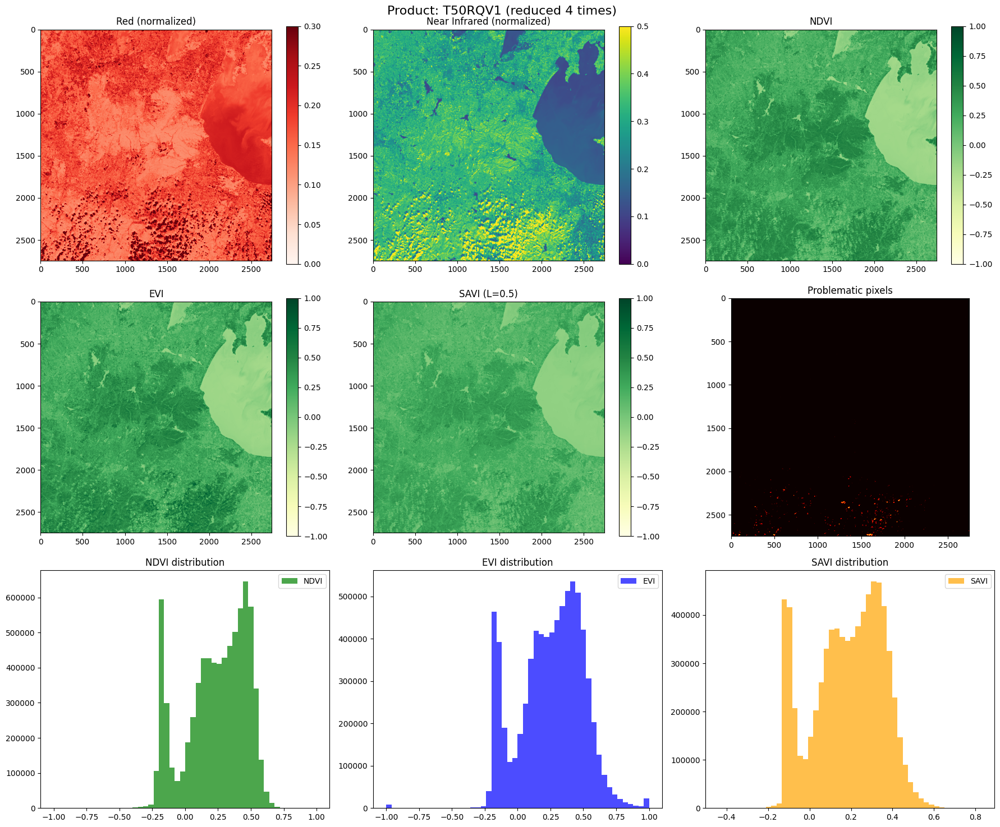

Finished processing T50RQV1

--- Processing tile: T50RQV2 ---
Processing product: T50RQV2
Path: data\S2C_MSIL2A_20251113T024511_N0511_R089_T50RQV_20251113T054013.SAFE\GRANULE\L2A_T50RQV_A006208_20251113T024512\IMG_DATA
Scale factor: 0.25
Searching for band files...
Found files:
blue_10m: T50RQV_20251113T024511_B02_10m.jp2
red_10m: T50RQV_20251113T024511_B04_10m.jp2
nir_10m: T50RQV_20251113T024511_B08_10m.jp2
Reading channels...
Read file: T50RQV_20251113T024511_B04_10m.jp2
Original size: 10980x10980
New size: (2745, 2745)
Read file: T50RQV_20251113T024511_B08_10m.jp2
Original size: 10980x10980
New size: (2745, 2745)
Read file: T50RQV_20251113T024511_B02_10m.jp2
Original size: 10980x10980
New size: (2745, 2745)
Original data:
RED: [0, 21394]
NIR: [0, 19246]
BLUE: [0, 22654]
Normalizing Sentinel-2 data...
After normalization:
RED: [0.000, 2.139]
NIR: [0.000, 1.925]
BLUE: [0.000, 2.265]
Masking results:
Division by zero: 2
Negative values: 0
Too large values: 8098
NaN values: 0
Total prob

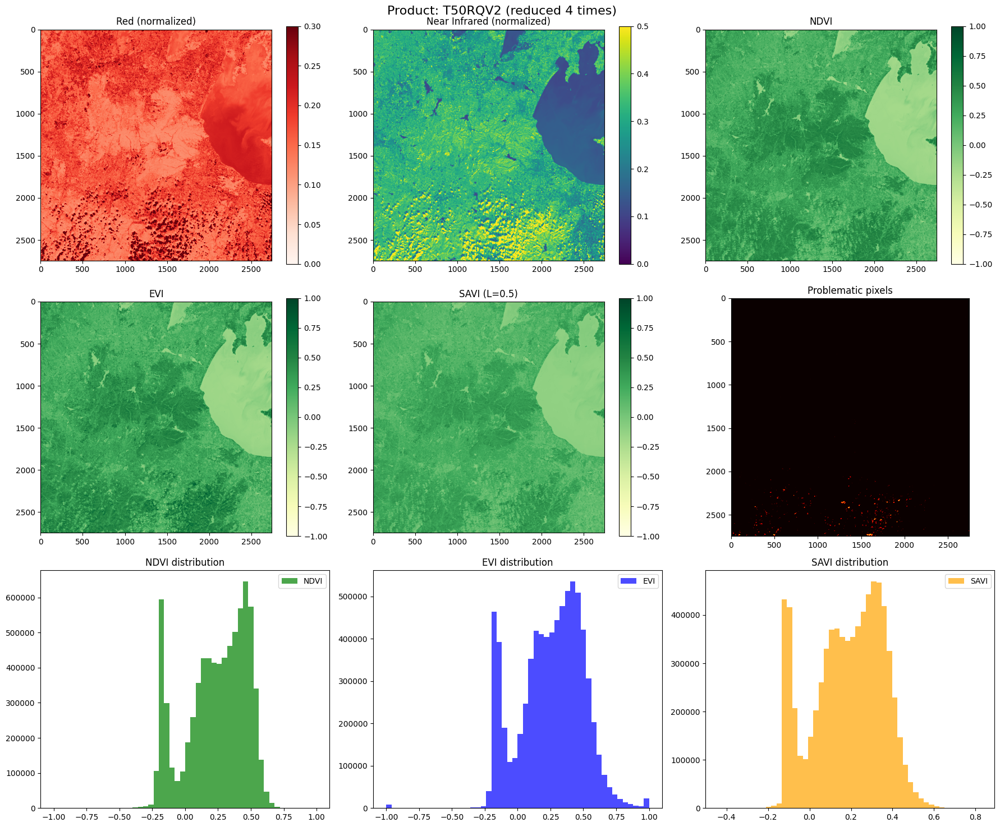

Finished processing T50RQV2


--------------------------------------------------
Processing completed! Successfully processed: 2 products.
--------------------------------------------------

T50RQV1 → Available keys: ['red_normalized', 'nir_normalized', 'blue_normalized', 'ndvi', 'evi', 'savi', 'vegetation_mask']
T50RQV2 → Available keys: ['red_normalized', 'nir_normalized', 'blue_normalized', 'ndvi', 'evi', 'savi', 'vegetation_mask']


In [35]:
# -----------------------------------------------------------
# Execute Sentinel-2 product processing (Notebook Version)
# -----------------------------------------------------------

# List of Sentinel-2 product folders to process
products = [
    {
        'name': 'T50RQV1',
        'base_path': os.path.join(
            "data",
            "S2C_MSIL2A_20251113T024511_N0511_R089_T50RQV_20251113T054013.SAFE",
            "GRANULE",
            "L2A_T50RQV_A006208_20251113T024512",
            "IMG_DATA"
        )
    },
    {
        'name': 'T50RQV2',
        'base_path': os.path.join(
            "data",
            "S2C_MSIL2A_20251113T024511_N0511_R089_T50RQV_20251113T054013.SAFE",
            "GRANULE",
            "L2A_T50RQV_A006208_20251113T024512",
            "IMG_DATA"
        )
    }
]

# Dictionary to store results for each processed tile
results = {}

print("Starting Sentinel-2 processing...\n")

for product in products:

    # Skip products that do not exist locally
    if not os.path.exists(product['base_path']):
        print(f"[WARNING] Path not found: {product['base_path']}\n")
        continue

    print(f"--- Processing tile: {product['name']} ---")
    
    # Scale factor = 0.25 (downsample to 25% of original size)
    tile_result = process_sentinel2_product(
        base_path=product['base_path'],
        product_name=product['name'],
        scale_factor=0.25
    )

    # Only store valid results
    if tile_result is not None:
        results[product['name']] = tile_result
        print(f"Finished processing {product['name']}\n")
    else:
        print(f"[ERROR] Failed to process {product['name']}\n")

print("\n--------------------------------------------------")
print(f"Processing completed! Successfully processed: {len(results)} products.")
print("--------------------------------------------------\n")

# Optional: Inspect available outputs per product
for name, r in results.items():
    print(f"{name} → Available keys: {list(r.keys())}")


# 📘 PHASE 2 & 3 — Vegetation Index Computation & Land Cover Classification

This phase processes raw Sentinel-2 satellite imagery into meaningful ecological information.  
It covers two major steps:

1. **Vegetation index computation (NDVI)**  
2. **Land cover classification using NDVI thresholds**

Your code performs both tasks together, so we document them as a single integrated module.

---

## 🌿 PHASE 2 — NDVI Computation

After loading and normalizing Sentinel-2 spectral bands (Red & NIR), we compute:

### **Normalized Difference Vegetation Index (NDVI)**  
\[
NDVI = \frac{NIR - Red}{NIR + Red}
\]

NDVI provides a strong measure of vegetation “greenness” and correlates with:

- Photosynthetic activity  
- Canopy density  
- Biomass  
- Vegetation health  

### **NDVI workflow in this phase:**

1. Read and optionally downsample Sentinel-2 B04 (Red) and B08 (NIR).
2. Convert values to reflectance by dividing by 10,000.
3. Identify invalid pixels (NaNs, zero-sum pairs, negative or extreme values).
4. Compute NDVI only on valid pixels.
5. Print useful summary statistics:
   - NDVI min
   - NDVI max
   - NDVI mean

The resulting NDVI raster provides a quantitative basis for land cover classification.

---

## 🌲 PHASE 3 — Land Cover Classification

Using NDVI, we categorize the landscape into four canopy-density classes.  
This provides an interpretable map of forest density and land type.

### **Classification rules:**

| NDVI Range   | Class ID | Label          |
|--------------|----------|----------------|
| < 0.2        | 0        | Non-forest     |
| 0.2 – 0.4    | 1        | Sparse forest  |
| 0.4 – 0.6    | 2        | Moderate forest|
| > 0.6        | 3        | Dense forest   |

These thresholds correspond to typical spectral behavior of vegetation.

### **Outputs produced:**

- A **classification raster** aligned with NDVI.
- A **summary table** showing:
  - Area (ha) of each class  
  - Percent of tile covered  
  - Pixel counts  
- A **visual map** of the classification result.
- A **bar chart** of land-cover distribution.

---

## 🗺️ Visualization Outputs

The processing pipeline produces a two-panel figure:

1. **Land cover map**  
   - Color-coded (red → yellow → green → dark green)  
   - Legend for forest density classes  

2. **Area distribution chart**  
   - Total area per class in hectares  
   - Percentage labels for quick interpretation  

These visualizations help evaluate landscape structure and ecological conditions.

---

## 📦 Returned Outputs

Each processed tile generates:

- `ndvi` — vegetation index raster  
- `classification` — land cover map (class IDs 0–3)  
- `class_areas` — area + percentage + pixel count per class  
- `valid_mask` — mask of pixels used for NDVI calculation  

These outputs feed into future phases:
- **Biomass estimation (Phase 4)**  
- **Carbon storage (Phase 5)**  
- **Habitat / biodiversity analysis (Phase 6+)**  

This completes your NDVI vegetation assessment and land-cover classification.



Processing product: T50RQV1
Path: data\S2C_MSIL2A_20251113T024511_N0511_R089_T50RQV_20251113T054013.SAFE\GRANULE\L2A_T50RQV_A006208_20251113T024512\IMG_DATA
Scale factor: 0.25
Searching for band files...
Found files:
blue_10m: T50RQV_20251113T024511_B02_10m.jp2
red_10m: T50RQV_20251113T024511_B04_10m.jp2
nir_10m: T50RQV_20251113T024511_B08_10m.jp2
Reading channels...
Read file: T50RQV_20251113T024511_B04_10m.jp2
Original size: 10980x10980
New size: (2745, 2745)
Read file: T50RQV_20251113T024511_B08_10m.jp2
Original size: 10980x10980
New size: (2745, 2745)
Read file: T50RQV_20251113T024511_B02_10m.jp2
Original size: 10980x10980
New size: (2745, 2745)
Normalizing Sentinel-2 data...
Masking results:
Division by zero: 2
Negative values: 0
Too large values: 8098
NaN values: 0
Total problematic: 8100
Valid pixels: 7526925
Calculating vegetation indices...
NDVI statistics:
Min: -1.000
Max: 1.000
Mean: 0.239
Performing land cover classification...
Creating classification map...


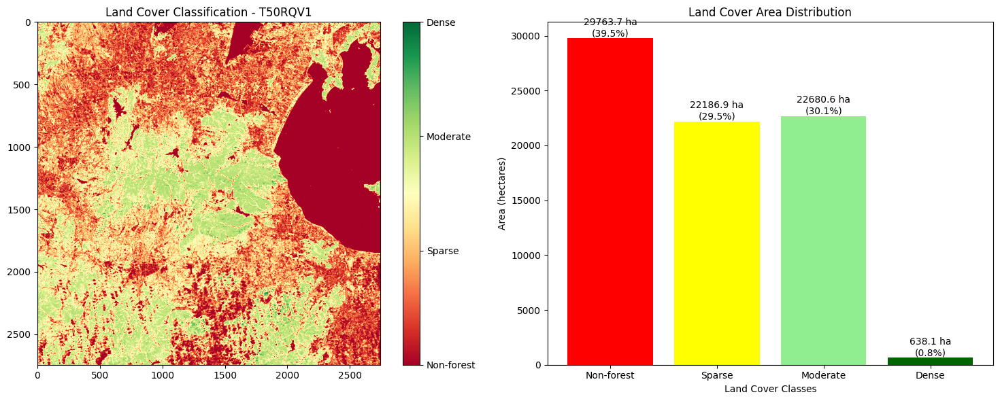

Generating summary statistics...

Land Cover Classification Summary - T50RQV1
Class        Area (ha)    Percentage   Pixels    
--------------------------------------------------
Non-forest   29763.66     39.5         2976366   
Sparse       22186.91     29.5         2218691   
Moderate     22680.59     30.1         2268059   
Dense        638.09       0.8          63809     
--------------------------------------------------
Total        75269.25     100.0        7526925   

Processing product: T50RQV2
Path: data\S2C_MSIL2A_20251113T024511_N0511_R089_T50RQV_20251113T054013.SAFE\GRANULE\L2A_T50RQV_A006208_20251113T024512\IMG_DATA
Scale factor: 0.25
Searching for band files...
Found files:
blue_10m: T50RQV_20251113T024511_B02_10m.jp2
red_10m: T50RQV_20251113T024511_B04_10m.jp2
nir_10m: T50RQV_20251113T024511_B08_10m.jp2
Reading channels...
Read file: T50RQV_20251113T024511_B04_10m.jp2
Original size: 10980x10980
New size: (2745, 2745)
Read file: T50RQV_20251113T024511_B08_10m.jp2
Origina

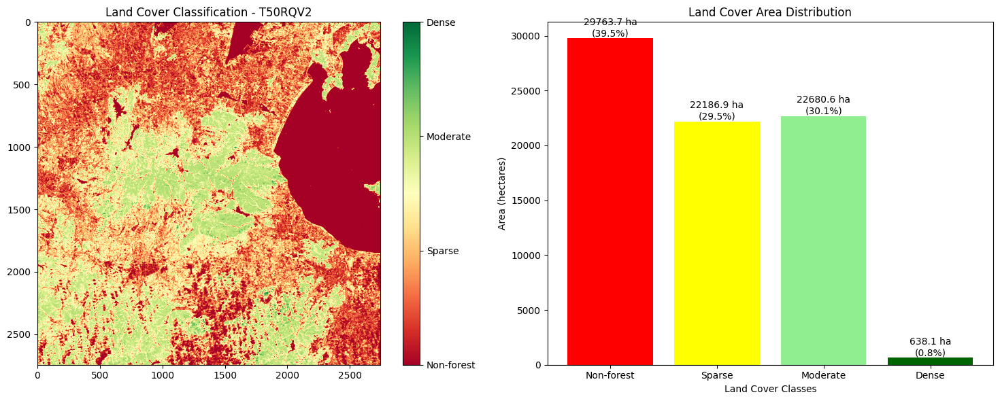

Generating summary statistics...

Land Cover Classification Summary - T50RQV2
Class        Area (ha)    Percentage   Pixels    
--------------------------------------------------
Non-forest   29763.66     39.5         2976366   
Sparse       22186.91     29.5         2218691   
Moderate     22680.59     30.1         2268059   
Dense        638.09       0.8          63809     
--------------------------------------------------
Total        75269.25     100.0        7526925   
Processing completed! Processed products: 2


In [21]:
import rasterio
import numpy as np
import matplotlib.pyplot as plt
import os
import glob

def find_band_files(base_path):
    band_files = {}
    
    for root, dirs, files in os.walk(base_path):
        for file in files:
            if file.endswith('.jp2'):
                file_path = os.path.join(root, file)
                
                if 'B04' in file and '10m' in file:
                    band_files['red_10m'] = file_path
                elif 'B08' in file and '10m' in file:
                    band_files['nir_10m'] = file_path
                elif 'B02' in file and '10m' in file:
                    band_files['blue_10m'] = file_path
    
    return band_files

def read_and_downsample_raster(file_path, scale_factor=0.25):
    with rasterio.open(file_path) as src:
        data = src.read(
            1,
            out_shape=(
                src.count,
                int(src.height * scale_factor),
                int(src.width * scale_factor)
            ),
            resampling=rasterio.enums.Resampling.average
        )
        print(f"Read file: {os.path.basename(file_path)}")
        print(f"Original size: {src.height}x{src.width}")
        print(f"New size: {data.shape}")
        return data

def calculate_ndvi_sentinel2(red_band, nir_band, valid_mask):
    ndvi = np.full_like(red_band, dtype=np.float32, fill_value=np.nan)
    
    red_valid = red_band[valid_mask]
    nir_valid = nir_band[valid_mask]
    
    ndvi_valid = (nir_valid - red_valid) / (nir_valid + red_valid + 1e-8)
    ndvi[valid_mask] = ndvi_valid
    
    valid_ndvi = ndvi_valid[~np.isnan(ndvi_valid)]
    if len(valid_ndvi) > 0:
        print(f"NDVI statistics:")
        print(f"Min: {np.min(valid_ndvi):.3f}")
        print(f"Max: {np.max(valid_ndvi):.3f}")
        print(f"Mean: {np.mean(valid_ndvi):.3f}")
    
    return ndvi

def classify_land_cover(ndvi):
    classification = np.full_like(ndvi, dtype=np.int8, fill_value=-1)
    
    valid_mask = ~np.isnan(ndvi)
    
    classification[valid_mask & (ndvi < 0.2)] = 0   # Non-forest
    classification[valid_mask & (ndvi >= 0.2) & (ndvi < 0.4)] = 1  # Sparse
    classification[valid_mask & (ndvi >= 0.4) & (ndvi < 0.6)] = 2  # Moderate
    classification[valid_mask & (ndvi >= 0.6)] = 3  # Dense
    
    return classification

def calculate_class_area(classification, pixel_size=10):
    class_names = ['Non-forest', 'Sparse', 'Moderate', 'Dense']
    class_areas = {}
    
    total_pixels = np.sum(classification >= 0)
    
    for class_id, class_name in enumerate(class_names):
        class_pixels = np.sum(classification == class_id)
        area_hectares = (class_pixels * pixel_size * pixel_size) / 10000
        percentage = (class_pixels / total_pixels * 100) if total_pixels > 0 else 0
        class_areas[class_name] = {
            'area_hectares': area_hectares,
            'percentage': percentage,
            'pixels': class_pixels
        }
    
    return class_areas

def create_classification_map(classification, product_name):
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 6))
    
    class_colors = ['red', 'yellow', 'lightgreen', 'darkgreen']
    class_names = ['Non-forest', 'Sparse', 'Moderate', 'Dense']
    
    im = ax1.imshow(classification, cmap='RdYlGn', vmin=0, vmax=3)
    ax1.set_title(f'Land Cover Classification - {product_name}')
    
    cbar = plt.colorbar(im, ax=ax1, ticks=[0, 1, 2, 3])
    cbar.ax.set_yticklabels(class_names)
    
    class_areas = calculate_class_area(classification)
    
    areas = [class_areas[name]['area_hectares'] for name in class_names]
    percentages = [class_areas[name]['percentage'] for name in class_names]
    
    bars = ax2.bar(class_names, areas, color=class_colors)
    ax2.set_title('Land Cover Area Distribution')
    ax2.set_ylabel('Area (hectares)')
    ax2.set_xlabel('Land Cover Classes')
    
    for bar, percentage in zip(bars, percentages):
        height = bar.get_height()
        ax2.text(bar.get_x() + bar.get_width()/2., height,
                f'{height:.1f} ha\n({percentage:.1f}%)',
                ha='center', va='bottom')
    
    plt.tight_layout()
    plt.show()
    
    return class_areas

def print_summary_statistics(class_areas, product_name):
    print(f"\nLand Cover Classification Summary - {product_name}")
    print("=" * 50)
    print(f"{'Class':<12} {'Area (ha)':<12} {'Percentage':<12} {'Pixels':<10}")
    print("-" * 50)
    
    total_area = 0
    total_pixels = 0
    
    for class_name, stats in class_areas.items():
        print(f"{class_name:<12} {stats['area_hectares']:<12.2f} {stats['percentage']:<12.1f} {stats['pixels']:<10}")
        total_area += stats['area_hectares']
        total_pixels += stats['pixels']
    
    print("-" * 50)
    print(f"{'Total':<12} {total_area:<12.2f} {'100.0':<12} {total_pixels:<10}")

def process_sentinel2_product(base_path, product_name, scale_factor=0.25):
    print(f"\nProcessing product: {product_name}")
    print(f"Path: {base_path}")
    print(f"Scale factor: {scale_factor}")
    
    try:
        print("Searching for band files...")
        band_files = find_band_files(base_path)
        
        print("Found files:")
        for band_type, file_path in band_files.items():
            print(f"{band_type}: {os.path.basename(file_path)}")
        
        if 'red_10m' not in band_files or 'nir_10m' not in band_files:
            print("Required channels B04 and B08 10m not found")
            return None
        
        print("Reading channels...")
        red_10m = read_and_downsample_raster(band_files['red_10m'], scale_factor)
        nir_10m = read_and_downsample_raster(band_files['nir_10m'], scale_factor)

        if 'blue_10m' in band_files:
            blue_10m = read_and_downsample_raster(band_files['blue_10m'], scale_factor)
        else:
            print("Blue channel (B02) not found, creating zero array")
            blue_10m = np.zeros_like(red_10m)

        print("Normalizing Sentinel-2 data...")
        red_normalized = red_10m.astype(np.float32) / 10000.0
        nir_normalized = nir_10m.astype(np.float32) / 10000.0
        blue_normalized = blue_10m.astype(np.float32) / 10000.0

        def create_safety_mask_sentinel2(red_band, nir_band):
            zero_mask = (red_band + nir_band) == 0
            negative_mask = (red_band < 0) | (nir_band < 0)
            too_large_mask = (red_band > 1.2) | (nir_band > 1.2)
            nan_mask = np.isnan(red_band) | np.isnan(nir_band)
            
            invalid_mask = zero_mask | negative_mask | too_large_mask | nan_mask
            
            print(f"Masking results:")
            print(f"Division by zero: {np.sum(zero_mask)}")
            print(f"Negative values: {np.sum(negative_mask)}")
            print(f"Too large values: {np.sum(too_large_mask)}")
            print(f"NaN values: {np.sum(nan_mask)}")
            print(f"Total problematic: {np.sum(invalid_mask)}")
            print(f"Valid pixels: {np.sum(~invalid_mask)}")
            
            return invalid_mask

        invalid_mask = create_safety_mask_sentinel2(red_normalized, nir_normalized)
        valid_mask = ~invalid_mask

        print("Calculating vegetation indices...")
        ndvi = calculate_ndvi_sentinel2(red_normalized, nir_normalized, valid_mask)

        print("Performing land cover classification...")
        classification = classify_land_cover(ndvi)

        print("Creating classification map...")
        class_areas = create_classification_map(classification, product_name)

        print("Generating summary statistics...")
        print_summary_statistics(class_areas, product_name)
        
        return {
            'ndvi': ndvi,
            'classification': classification,
            'class_areas': class_areas,
            'valid_mask': valid_mask
        }
        
    except Exception as e:
        print(f"Error processing product: {e}")
        return None

def main():
    products = [
        {
            'name': 'T50RQV1',
            'base_path': r"data\S2C_MSIL2A_20251113T024511_N0511_R089_T50RQV_20251113T054013.SAFE\GRANULE\L2A_T50RQV_A006208_20251113T024512\IMG_DATA"
        },
        #{
        #    'name': 'T51RTQ1',
        #    'base_path': r"data\S2C_MSIL1C_20251113T024511_N0511_R089_T51RTQ_20251113T035440.SAFE\GRANULE\L1C_T51RTQ_A006208_20251113T024512\IMG_DATA"
        #},
        {
            'name': 'T50RQV2',
            'base_path': r"data\S2C_MSIL2A_20251113T024511_N0511_R089_T50RQV_20251113T054013.SAFE\GRANULE\L2A_T50RQV_A006208_20251113T024512\IMG_DATA"
        },
        #{
        #    'name': 'T51RTQ2',
        #    'base_path': r"data\S2C_MSIL2A_20251113T024511_N0511_R089_T51RTQ_20251113T054013.SAFE\GRANULE\L2A_T50RQV_A006208_20251113T024512\IMG_DATA"
        #},
    ]
    
    results = {}
    
    for product in products:
        if not os.path.exists(product['base_path']):
            print(f"Path does not exist: {product['base_path']}")
            continue
            
        result = process_sentinel2_product(product['base_path'], product['name'], scale_factor=0.25)
        if result is not None:
            results[product['name']] = result
    
    print(f"Processing completed! Processed products: {len(results)}")
    
    if len(results) == 0:
        print("Try reducing scale_factor to 0.1 or 0.05 to save memory")
    
    return results

if __name__ == "__main__":
    results = main()

# 📘 PHASE 4 — Aboveground Biomass Estimation (Allometric Equations)

In this phase, we take vegetation indices (NDVI and EVI) and convert them into estimates of **aboveground forest biomass (AGB)** using published allometric equations.  
This phase corresponds to Tasks **4.1 through 4.6** in the hackathon.

---

# 🌲 4.1 — Vegetation Indices for Biomass Estimation

We compute vegetation indices from Sentinel-2 spectral bands:

- **NDVI** using Red (B04) and NIR (B08)
- **EVI** using Red (B04), NIR (B08), and Blue (B02)

These indices correlate with canopy density, chlorophyll content, and vegetation productivity — all of which are useful proxies for biomass.

---

# 🌳 4.2 — Apply Forest-Specific Allometric Equations

Different forest biomes have different structural characteristics.  
Therefore, biomass is estimated using an allometric model tailored to the dominant forest type.

The code supports four forest types:

| Forest Type      | Equation | Source |
|------------------|----------|--------|
| **Tropical** | 47.5 + 320.6·NDVI − 245.8·NDVI² | Brown (1997) |
| **Temperate** | 12.3 + 285.5·NDVI | Zheng et al. (2004) |
| **Mediterranean** | 156.4 × EVI^1.34 | Alvão & Palmeirim (2004) |
| **Boreal** | 8.9 + 198.7·NDVI | Tomppo et al. (2002) |

The notebook prints the equation used and the **R²** values from literature.

---

# 🌱 4.3 — Vegetation Thresholding

A vegetation mask is applied to ensure biomass is only calculated on vegetated pixels:

- **Mediterranean forests** → EVI > 0.15  
- **All others** → NDVI > 0.2  

Pixels failing the threshold are set to zero biomass.

This reduces noise and avoids artificially high biomass in barren or low-signal areas.

---

# 🌄 4.4 — Apply Biomass Bounds

To ensure stable and realistic results, the following constraints are applied:

- Negative biomass values → set to **0**
- Extremely large biomass → capped at **500 tons/ha**  
  (reasonable upper estimate for mature forests)

The code also reports the resulting biomass range after bounding.

---

# 🧮 4.5 — Total Biomass Computation

Total aboveground biomass is estimated by summing all per-pixel biomass values:

\[
\text{Total Biomass (tons)} = \sum (\text{Biomass per pixel} \times 0.01\;\text{ha})
\]

Since Sentinel-2 data is 10m resolution:

- Each pixel = **100 m² = 0.01 ha**

The function outputs:

- Total biomass (tons)
- Average biomass in vegetated areas
- Maximum biomass
- Total vegetated area (ha)
- Vegetation coverage (%)

---

# 🌍 4.6 — Biomass Visualization Outputs

A four-panel figure is generated:

### **1. NDVI Map**  
Shows vegetation greenness and spatial distribution.

### **2. Biomass Map**  
Displays biomass intensity (0–500 tons/ha) using a yellow-to-brown colormap.

### **3. Biomass Histogram**  
Reveals biomass distribution across the landscape, with density thresholds marked.

### **4. Biomass vs NDVI Scatterplot**  
Shows the relationship between NDVI and biomass using a 10% sampled subset.

This figure is returned for saving/export if needed.

---

# 🌐 Ecosystem Services Assessment

Based on biomass density, the code evaluates ecosystem services:

- **Water Flow Regulation**  
- **Water Purification**  
- **Sediment Control**  
- **Aquifer Recharge**  
- **Flood Protection**

These qualitative ratings (Low / Medium / High) follow ecological logic tied to vegetation density.

---

# 🧾 Outputs of Phase 4

Each processed product returns:

- NDVI raster  
- EVI raster  
- Biomass raster (bounded & masked)  
- Vegetation mask  
- Total biomass (tons)  
- Average biomass (tons/ha)  
- Maximum biomass (tons/ha)  
- Forest type used  
- Allometric equation info  
- Final biomass visualization figure  

These outputs feed directly into later phases involving:

- Carbon stock estimation  
- Hydrological modeling  
- Valuation of ecosystem services  

This completes **PHASE 4: Biomass Estimation from Vegetation Indices**.


PHASE 4: Biomass Estimation with Allometric Equations
Selected forest type: Temperate
Available equations:
  Tropical: Biomass = 47.5 + 320.6×NDVI - 245.8×NDVI² (R²=0.72)
  Temperate: Biomass = 12.3 + 285.5×NDVI (R²=0.68)
  Mediterranean: Biomass = 156.4 × EVI^1.34 (R²=0.65)
  Boreal: Biomass = 8.9 + 198.7×NDVI (R²=0.61)
Starting biomass estimation for: T50RQV1
Forest type: Temperate
Read file: T50RQV_20251113T024511_B04_10m.jp2
Read file: T50RQV_20251113T024511_B08_10m.jp2
Read file: T50RQV_20251113T024511_B02_10m.jp2
Applied allometric equation: Temperate: Biomass = 12.3 + 285.5×NDVI (Zheng et al., 2004)
R² values: Tropical=0.72, Temperate=0.68, Mediterranean=0.65, Boreal=0.61
Vegetation threshold: NDVI > 0.2 (Temperate forest threshold)
Vegetation pixels: 4550284 (60.4%)
Biomass bounds applied: 0 - 500.0 tons/ha
Biomass range: 69.4 - 297.8 tons/ha

Biomass Statistics:
Total biomass: 5,701,932 tons
Average biomass (vegetated areas): 125.3 tons/ha
Maximum biomass: 297.8 tons/ha
Vegeta

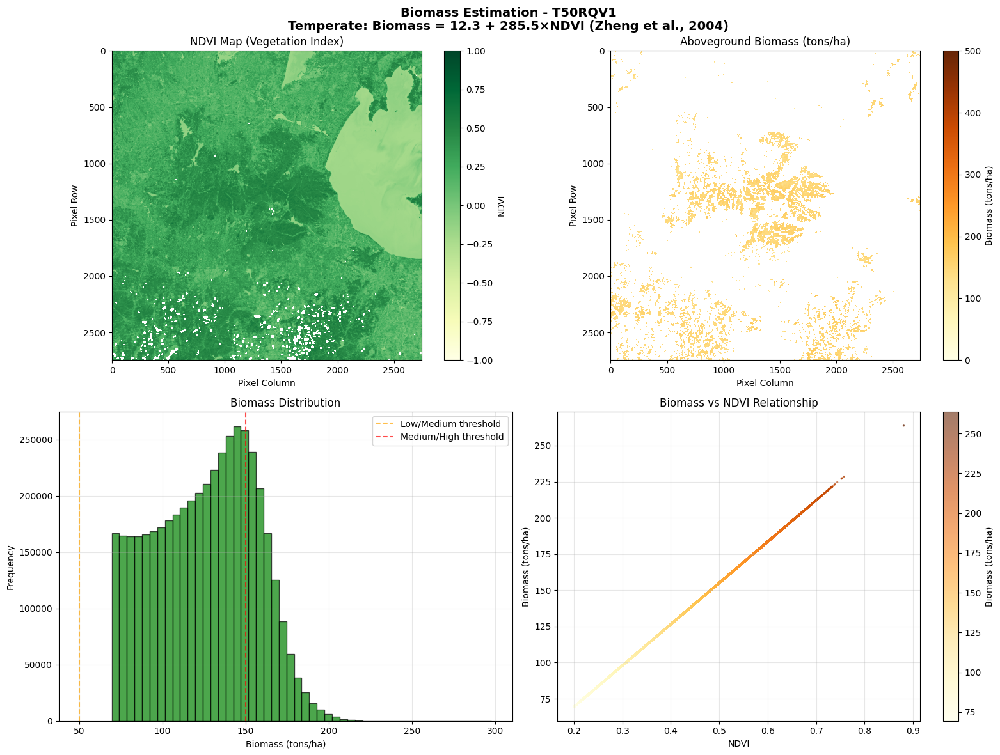


Biomass estimation completed successfully for T50RQV1
Forest type: Temperate
Total aboveground biomass: 5,701,932 tons


In [22]:
import rasterio
import numpy as np
import matplotlib.pyplot as plt
import os

def find_band_files(base_path):
    """
    Automatically finds band files in folder
    """
    band_files = {}
    
    for root, dirs, files in os.walk(base_path):
        for file in files:
            if file.endswith('.jp2'):
                file_path = os.path.join(root, file)
                
                if 'B04' in file and '10m' in file:
                    band_files['red_10m'] = file_path
                elif 'B08' in file and '10m' in file:
                    band_files['nir_10m'] = file_path
                elif 'B02' in file and '10m' in file:
                    band_files['blue_10m'] = file_path
    
    return band_files

def read_and_downsample_raster(file_path, scale_factor=0.25):
    """
    Reads raster file and reduces size for memory efficiency
    """
    with rasterio.open(file_path) as src:
        data = src.read(
            1,
            out_shape=(
                src.count,
                int(src.height * scale_factor),
                int(src.width * scale_factor)
            ),
            resampling=rasterio.enums.Resampling.average
        )
        print(f"Read file: {os.path.basename(file_path)}")
        return data

def calculate_ndvi_sentinel2(red_band, nir_band, valid_mask):
    """
    Calculate NDVI for normalized Sentinel-2 data
    """
    ndvi = np.full_like(red_band, dtype=np.float32, fill_value=np.nan)
    
    red_valid = red_band[valid_mask]
    nir_valid = nir_band[valid_mask]
    
    ndvi_valid = (nir_valid - red_valid) / (nir_valid + red_valid + 1e-8)
    ndvi[valid_mask] = ndvi_valid
    
    return ndvi

def calculate_evi_sentinel2(red_band, nir_band, blue_band, valid_mask):
    """
    Calculate EVI for normalized Sentinel-2 data
    Formula: EVI = 2.5 × ({NIR - Red} / {NIR + 6×Red - 7.5×Blue + 1})
    """
    evi = np.full_like(red_band, dtype=np.float32, fill_value=np.nan)
    
    red_valid = red_band[valid_mask]
    nir_valid = nir_band[valid_mask]
    blue_valid = blue_band[valid_mask]
    
    denominator = nir_valid + 6 * red_valid - 7.5 * blue_valid + 1
    evi_valid = 2.5 * (nir_valid - red_valid) / (denominator + 1e-8)
    evi_valid = np.clip(evi_valid, -1.0, 1.0)
    
    evi[valid_mask] = evi_valid
    
    return evi

def apply_allometric_equation(ndvi, evi, forest_type='Temperate'):
    """
    Task 4.1 & 4.2: Apply appropriate allometric equation based on forest type
    """
    biomass = np.full_like(ndvi, dtype=np.float32, fill_value=0.0)
    valid_mask = ~np.isnan(ndvi)
    
    if forest_type == 'Tropical':
        # Biomass = 47.5 + 320.6×NDVI - 245.8×NDVI²
        biomass_valid = 47.5 + 320.6 * ndvi[valid_mask] - 245.8 * (ndvi[valid_mask] ** 2)
        equation_info = "Tropical: Biomass = 47.5 + 320.6×NDVI - 245.8×NDVI² (Brown, 1997)"
        
    elif forest_type == 'Temperate':
        # Biomass = 12.3 + 285.5×NDVI
        biomass_valid = 12.3 + 285.5 * ndvi[valid_mask]
        equation_info = "Temperate: Biomass = 12.3 + 285.5×NDVI (Zheng et al., 2004)"
        
    elif forest_type == 'Mediterranean':
        # Biomass = 156.4 × EVI^1.34
        evi_valid = evi[valid_mask]
        biomass_valid = 156.4 * (np.maximum(evi_valid, 0) ** 1.34)
        equation_info = "Mediterranean: Biomass = 156.4 × EVI^1.34 (Alvão & Palmeirim, 2004)"
        
    elif forest_type == 'Boreal':
        # Biomass = 8.9 + 198.7×NDVI
        biomass_valid = 8.9 + 198.7 * ndvi[valid_mask]
        equation_info = "Boreal: Biomass = 8.9 + 198.7×NDVI (Tomppo et al., 2002)"
        
    else:
        # Default to Temperate
        biomass_valid = 12.3 + 285.5 * ndvi[valid_mask]
        equation_info = "Temperate (default): Biomass = 12.3 + 285.5×NDVI (Zheng et al., 2004)"
    
    biomass[valid_mask] = biomass_valid
    
    print(f"Applied allometric equation: {equation_info}")
    print(f"R² values: Tropical=0.72, Temperate=0.68, Mediterranean=0.65, Boreal=0.61")
    
    return biomass, equation_info

def apply_vegetation_threshold(biomass, ndvi, evi, forest_type='Temperate'):
    """
    Task 4.3: Apply vegetation threshold mask based on forest type
    """
    if forest_type == 'Mediterranean':
        # Use EVI threshold for Mediterranean
        vegetation_mask = evi > 0.15
        threshold_info = f"EVI > 0.15 (Mediterranean forest threshold)"
    else:
        # Use NDVI threshold for other forest types
        vegetation_mask = ndvi > 0.2
        threshold_info = f"NDVI > 0.2 ({forest_type} forest threshold)"
    
    biomass_masked = biomass.copy()
    biomass_masked[~vegetation_mask] = 0.0
    
    vegetation_pixels = np.sum(vegetation_mask)
    total_pixels = vegetation_mask.size
    
    print(f"Vegetation threshold: {threshold_info}")
    print(f"Vegetation pixels: {vegetation_pixels} ({vegetation_pixels/total_pixels*100:.1f}%)")
    
    return biomass_masked, vegetation_mask

def apply_biomass_bounds(biomass, max_biomass=500.0):
    """
    Task 4.4: Implement biomass bounds with reasonable maximum
    """
    biomass_bounded = biomass.copy()
    
    # Remove negative values
    biomass_bounded[biomass_bounded < 0] = 0.0
    
    # Apply maximum biomass cap
    biomass_bounded[biomass_bounded > max_biomass] = max_biomass
    
    non_zero_biomass = biomass_bounded[biomass_bounded > 0]
    if len(non_zero_biomass) > 0:
        print(f"Biomass bounds applied: 0 - {max_biomass} tons/ha")
        print(f"Biomass range: {np.min(non_zero_biomass):.1f} - {np.max(non_zero_biomass):.1f} tons/ha")
    
    return biomass_bounded

def calculate_total_biomass(biomass, pixel_size=10):
    """
    Task 4.5: Calculate total biomass by summing all pixels and converting units
    """
    # Pixel area in hectares (10m x 10m = 100m² = 0.01 ha)
    pixel_area_ha = (pixel_size * pixel_size) / 10000.0
    
    # Total biomass in tons = sum(biomass_per_pixel × pixel_area_ha)
    total_biomass_tons = np.sum(biomass) * pixel_area_ha
    
    # Calculate statistics
    non_zero_biomass = biomass[biomass > 0]
    if len(non_zero_biomass) > 0:
        avg_biomass = np.mean(non_zero_biomass)
        max_biomass = np.max(non_zero_biomass)
        biomass_pixels = len(non_zero_biomass)
    else:
        avg_biomass = max_biomass = 0.0
        biomass_pixels = 0
    
    total_area_ha = biomass.size * pixel_area_ha
    vegetated_area_ha = biomass_pixels * pixel_area_ha
    
    print(f"\nBiomass Statistics:")
    print(f"Total biomass: {total_biomass_tons:,.0f} tons")
    print(f"Average biomass (vegetated areas): {avg_biomass:.1f} tons/ha")
    print(f"Maximum biomass: {max_biomass:.1f} tons/ha")
    print(f"Vegetated area: {vegetated_area_ha:,.0f} ha")
    print(f"Total study area: {total_area_ha:,.0f} ha")
    print(f"Vegetation coverage: {vegetated_area_ha/total_area_ha*100:.1f}%")
    
    return total_biomass_tons, avg_biomass, max_biomass

def assess_ecosystem_services(biomass, ndvi, total_biomass_tons):
    """
    Assess ecosystem services based on biomass distribution
    """
    print(f"\nEcosystem Services Assessment:")
    print("=" * 40)
    
    # Calculate biomass density classes
    low_biomass = np.sum((biomass > 0) & (biomass <= 50))  # Young forests, sparse vegetation
    medium_biomass = np.sum((biomass > 50) & (biomass <= 150))  # Medium density forests
    high_biomass = np.sum(biomass > 150)  # Mature dense forests
    
    total_vegetated = low_biomass + medium_biomass + high_biomass
    
    if total_vegetated > 0:
        low_percent = low_biomass / total_vegetated * 100
        medium_percent = medium_biomass / total_vegetated * 100
        high_percent = high_biomass / total_vegetated * 100
        
        print(f"Biomass Density Classes:")
        print(f"  Low (0-50 tons/ha): {low_biomass} pixels ({low_percent:.1f}%)")
        print(f"  Medium (50-150 tons/ha): {medium_biomass} pixels ({medium_percent:.1f}%)")
        print(f"  High (>150 tons/ha): {high_biomass} pixels ({high_percent:.1f}%)")
        
        # Ecosystem services assessment
        print(f"\nKey Ecosystem Services:")
        
        # Water Flow Regulation - better with medium to high biomass
        water_regulation_index = (medium_biomass * 0.7 + high_biomass * 0.9) / total_vegetated
        print(f"  Water Flow Regulation: {'High' if water_regulation_index > 0.6 else 'Medium' if water_regulation_index > 0.3 else 'Low'}")
        
        # Water Purification - better with dense vegetation
        purification_index = high_biomass / total_vegetated
        print(f"  Water Purification: {'High' if purification_index > 0.4 else 'Medium' if purification_index > 0.2 else 'Low'}")
        
        # Sediment Control - directly related to biomass density
        sediment_control_index = (medium_biomass * 0.8 + high_biomass * 0.95) / total_vegetated
        print(f"  Sediment Control: {'High' if sediment_control_index > 0.6 else 'Medium' if sediment_control_index > 0.3 else 'Low'}")
        
        # Aquifer Recharge - moderate biomass optimal
        aquifer_index = (medium_biomass * 0.9 + high_biomass * 0.7) / total_vegetated
        print(f"  Aquifer Recharge: {'High' if aquifer_index > 0.6 else 'Medium' if aquifer_index > 0.3 else 'Low'}")
        
        # Flood Protection - high biomass provides best protection
        flood_protection_index = high_biomass / total_vegetated
        print(f"  Flood Protection: {'High' if flood_protection_index > 0.5 else 'Medium' if flood_protection_index > 0.25 else 'Low'}")

def create_biomass_map(biomass, ndvi, product_name, equation_info):
    """
    Task 4.6: Generate biomass distribution map with proper legend
    """
    fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(16, 12))
    fig.suptitle(f'Biomass Estimation - {product_name}\n{equation_info}', fontsize=14, fontweight='bold')
    
    # Plot 1: NDVI map
    im1 = ax1.imshow(ndvi, cmap='YlGn', vmin=-1, vmax=1)
    ax1.set_title('NDVI Map (Vegetation Index)')
    ax1.set_xlabel('Pixel Column')
    ax1.set_ylabel('Pixel Row')
    plt.colorbar(im1, ax=ax1, label='NDVI')
    
    # Plot 2: Biomass map
    biomass_display = biomass.copy()
    biomass_display[biomass_display == 0] = np.nan
    
    im2 = ax2.imshow(biomass_display, cmap='YlOrBr', vmin=0, vmax=500)
    ax2.set_title('Aboveground Biomass (tons/ha)')
    ax2.set_xlabel('Pixel Column')
    ax2.set_ylabel('Pixel Row')
    cbar = plt.colorbar(im2, ax=ax2, label='Biomass (tons/ha)')
    
    # Plot 3: Biomass histogram
    non_zero_biomass = biomass[biomass > 0]
    if len(non_zero_biomass) > 0:
        ax3.hist(non_zero_biomass, bins=50, color='green', alpha=0.7, edgecolor='black')
        ax3.set_title('Biomass Distribution')
        ax3.set_xlabel('Biomass (tons/ha)')
        ax3.set_ylabel('Frequency')
        ax3.grid(True, alpha=0.3)
        
        # Add vertical lines for biomass classes
        ax3.axvline(x=50, color='orange', linestyle='--', alpha=0.7, label='Low/Medium threshold')
        ax3.axvline(x=150, color='red', linestyle='--', alpha=0.7, label='Medium/High threshold')
        ax3.legend()
    
    # Plot 4: Biomass by NDVI relationship
    valid_mask = ~np.isnan(ndvi) & (biomass > 0)
    if np.sum(valid_mask) > 0:
        # Sample points for scatter plot to avoid overcrowding
        sample_mask = valid_mask & (np.random.random(ndvi.shape) < 0.1)  # 10% sample
        scatter = ax4.scatter(ndvi[sample_mask], biomass[sample_mask], 
                            c=biomass[sample_mask], cmap='YlOrBr', alpha=0.6, s=2)
        ax4.set_title('Biomass vs NDVI Relationship')
        ax4.set_xlabel('NDVI')
        ax4.set_ylabel('Biomass (tons/ha)')
        ax4.grid(True, alpha=0.3)
        plt.colorbar(scatter, ax=ax4, label='Biomass (tons/ha)')
    
    plt.tight_layout()
    plt.show()
    
    return fig

def process_biomass_estimation(base_path, product_name, forest_type='Temperate', scale_factor=0.25):
    """
    Main function for biomass estimation processing with allometric equations
    """
    print(f"Starting biomass estimation for: {product_name}")
    print(f"Forest type: {forest_type}")
    
    try:
        # Find and read band files
        band_files = find_band_files(base_path)
        
        if 'red_10m' not in band_files or 'nir_10m' not in band_files:
            print("Required channels not found")
            return None
        
        red_10m = read_and_downsample_raster(band_files['red_10m'], scale_factor)
        nir_10m = read_and_downsample_raster(band_files['nir_10m'], scale_factor)
        
        # Read blue channel if available for EVI
        if 'blue_10m' in band_files:
            blue_10m = read_and_downsample_raster(band_files['blue_10m'], scale_factor)
        else:
            print("Blue channel not found, creating zero array")
            blue_10m = np.zeros_like(red_10m)
        
        # Normalize Sentinel-2 data
        red_normalized = red_10m.astype(np.float32) / 10000.0
        nir_normalized = nir_10m.astype(np.float32) / 10000.0
        blue_normalized = blue_10m.astype(np.float32) / 10000.0
        
        # Create validity mask
        invalid_mask = ((red_normalized + nir_normalized) == 0) | \
                      (red_normalized < 0) | (nir_normalized < 0) | \
                      (red_normalized > 1.2) | (nir_normalized > 1.2) | \
                      np.isnan(red_normalized) | np.isnan(nir_normalized)
        valid_mask = ~invalid_mask
        
        # Calculate vegetation indices
        ndvi = calculate_ndvi_sentinel2(red_normalized, nir_normalized, valid_mask)
        evi = calculate_evi_sentinel2(red_normalized, nir_normalized, blue_normalized, valid_mask)
        
        # Task 4.1 & 4.2: Apply allometric equation
        biomass, equation_info = apply_allometric_equation(ndvi, evi, forest_type)
        
        # Task 4.3: Apply vegetation threshold
        biomass, vegetation_mask = apply_vegetation_threshold(biomass, ndvi, evi, forest_type)
        
        # Task 4.4: Apply biomass bounds
        biomass = apply_biomass_bounds(biomass, max_biomass=500.0)
        
        # Task 4.5: Calculate total biomass
        total_biomass, avg_biomass, max_biomass = calculate_total_biomass(biomass)
        
        # Ecosystem services assessment
        assess_ecosystem_services(biomass, ndvi, total_biomass)
        
        # Task 4.6: Generate biomass map
        fig = create_biomass_map(biomass, ndvi, product_name, equation_info)
        
        results = {
            'ndvi': ndvi,
            'evi': evi,
            'biomass': biomass,
            'vegetation_mask': vegetation_mask,
            'total_biomass_tons': total_biomass,
            'average_biomass': avg_biomass,
            'max_biomass': max_biomass,
            'forest_type': forest_type,
            'equation_info': equation_info,
            'fig': fig
        }
        
        return results
        
    except Exception as e:
        print(f"Error in biomass estimation: {e}")
        return None

def main():
    """
    Main execution function - using only the first product
    """
    products = [
        {
            'name': 'T50RQV1',
            'base_path': r"data\S2C_MSIL2A_20251113T024511_N0511_R089_T50RQV_20251113T054013.SAFE\GRANULE\L2A_T50RQV_A006208_20251113T024512\IMG_DATA"
        },
        #{
        #    'name': 'T51RTQ1',
        #    'base_path': r"data\S2C_MSIL1C_20251113T024511_N0511_R089_T51RTQ_20251113T035440.SAFE\GRANULE\L1C_T51RTQ_A006208_20251113T024512\IMG_DATA"
        #},
        {
            'name': 'T50RQV2',
            'base_path': r"data\S2C_MSIL2A_20251113T024511_N0511_R089_T50RQV_20251113T054013.SAFE\GRANULE\L2A_T50RQV_A006208_20251113T024512\IMG_DATA"
        },
        #{
        #    'name': 'T51RTQ2',
        #    'base_path': r"data\S2C_MSIL2A_20251113T024511_N0511_R089_T51RTQ_20251113T054013.SAFE\GRANULE\L2A_T50RQV_A006208_20251113T024512\IMG_DATA"
        #},
    ]
    
    print("PHASE 4: Biomass Estimation with Allometric Equations")
    print("=" * 60)
    
    # Available forest types
    forest_types = ['Tropical', 'Temperate', 'Mediterranean', 'Boreal']
    
    # Using Temperate as default (change as needed for your region)
    selected_forest_type = 'Temperate'
    
    print(f"Selected forest type: {selected_forest_type}")
    print("Available equations:")
    print("  Tropical: Biomass = 47.5 + 320.6×NDVI - 245.8×NDVI² (R²=0.72)")
    print("  Temperate: Biomass = 12.3 + 285.5×NDVI (R²=0.68)")
    print("  Mediterranean: Biomass = 156.4 × EVI^1.34 (R²=0.65)")
    print("  Boreal: Biomass = 8.9 + 198.7×NDVI (R²=0.61)")
    print("=" * 60)
    
    # Process only the first product
    product = products[0]
    
    if not os.path.exists(product['base_path']):
        print(f"Path does not exist: {product['base_path']}")
        return
    
    # Process biomass estimation
    results = process_biomass_estimation(product['base_path'], product['name'], 
                                       forest_type=selected_forest_type, scale_factor=0.25)
    
    if results is not None:
        print(f"\nBiomass estimation completed successfully for {product['name']}")
        print(f"Forest type: {results['forest_type']}")
        print(f"Total aboveground biomass: {results['total_biomass_tons']:,.0f} tons")
    else:
        print(f"Biomass estimation failed for {product['name']}")

if __name__ == "__main__":
    main()


# PHASE 5 — Carbon Stock Estimation

Biomass is converted to carbon using the standard IPCC factor.

\[
\text{Carbon} = 0.47 \times \text{Biomass}
\]

The result is a carbon density raster (tons C/ha).

Optionally:

\[
\text{CO}_2\text{ equivalent} = 3.67 \times \text{Carbon}
\]

**Outputs**

- Carbon raster  
- Total carbon stock  
- Carbon distribution statistics  
- Maps and histograms




Testing Phase 5 Analysis with Sample Data
PHASE 5: ANALYSIS & VALIDATION
TASK 5.1: DESCRIPTIVE STATISTICS
Biomass Statistics (tons/ha) - Vegetated Areas Only:
  Mean: 103.0
  Median: 86.4
  Standard Deviation: 70.2
  Minimum: 2.3
  Maximum: 389.3
  25th Percentile: 51.2
  75th Percentile: 136.5
  Sample Size: 998 pixels

NDVI Statistics - Vegetated Areas Only:
  Mean: 0.603
  Median: 0.602
  Standard Deviation: 0.144
  Minimum: 0.205
  Maximum: 1.000

TASK 5.2: BIOMASS DISTRIBUTION ANALYSIS


C:\Users\ICMAT User\AppData\Local\Temp\ipykernel_11096\3532484744.py:112: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  ax3.boxplot(biomass_data, labels=['Biomass'])


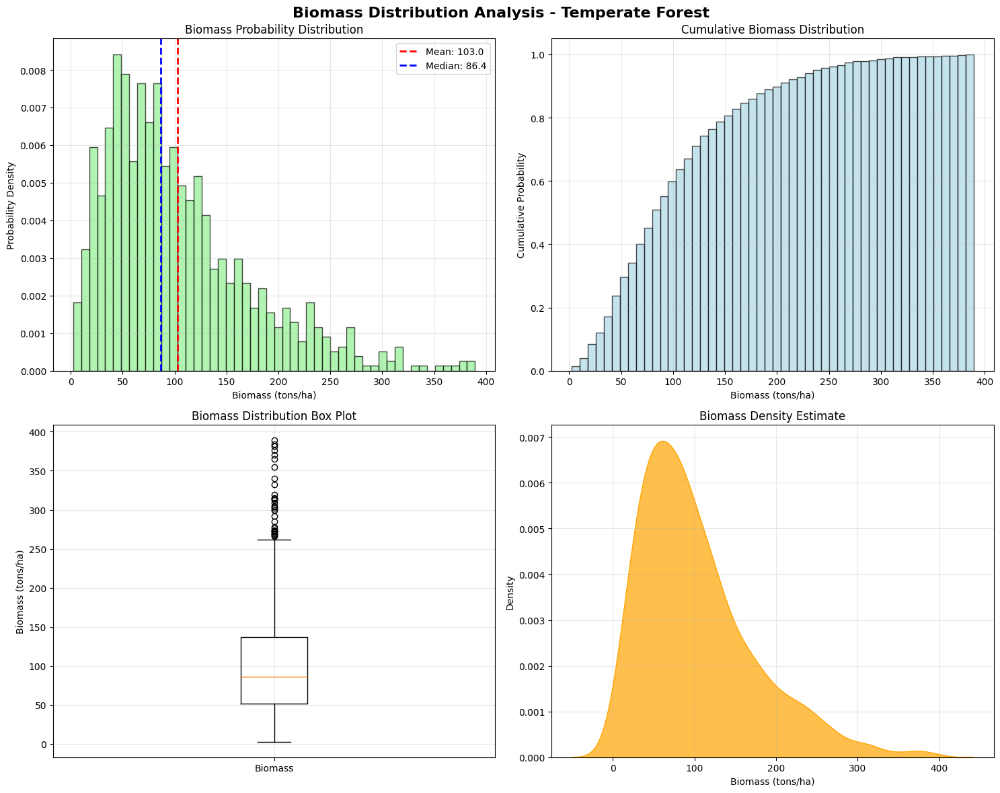

Distribution Characteristics:
  Skewness: 1.197
  Kurtosis: 1.427

Biomass Class Distribution:
  Very Low (0-25 tons/ha): 84 pixels (8.4%)
  Low (25-50 tons/ha): 159 pixels (15.9%)
  Medium (50-100 tons/ha): 342 pixels (34.3%)
  High (100-200 tons/ha): 306 pixels (30.7%)
  Very High (>200 tons/ha): 107 pixels (10.7%)

TASK 5.3: COMPARISON WITH PUBLISHED VALUES
Comparison for Temperate Forests:
  Estimated Mean Biomass: 103.0 tons/ha
  Published Typical Range: 50 - 300 tons/ha
  Published Typical Value: 150 tons/ha
  Data Source: Zheng et al. (2004)
  Assessment: Estimated value falls within expected range
  Deviation from typical: -31.4%
  Variability: Moderate variability (std: 70.2)

TASK 5.4: SENSITIVITY ANALYSIS
1. Vegetation Threshold Sensitivity:
  Threshold 0.15: 1,000 pixels (100.0%)
  Threshold 0.2: 998 pixels (99.8%)
  Threshold 0.25: 992 pixels (99.2%)
  Threshold 0.3: 982 pixels (98.2%)

2. Allometric Equation Sensitivity:
  Sample NDVI: 0.602
  Tropical    :  151.4 tons/ha

In [23]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from scipy import stats
import seaborn as sns

def compute_descriptive_statistics(biomass, ndvi, vegetation_mask):
    """
    Task 5.1: Compute descriptive statistics for biomass and NDVI
    """
    print("=" * 60)
    print("TASK 5.1: DESCRIPTIVE STATISTICS")
    print("=" * 60)
    
    # Biomass statistics (only vegetated areas)
    vegetated_biomass = biomass[vegetation_mask]
    non_zero_biomass = vegetated_biomass[vegetated_biomass > 0]
    
    if len(non_zero_biomass) > 0:
        biomass_stats = {
            'mean': np.mean(non_zero_biomass),
            'median': np.median(non_zero_biomass),
            'std': np.std(non_zero_biomass),
            'min': np.min(non_zero_biomass),
            'max': np.max(non_zero_biomass),
            'q25': np.percentile(non_zero_biomass, 25),
            'q75': np.percentile(non_zero_biomass, 75),
            'count': len(non_zero_biomass)
        }
        
        print("Biomass Statistics (tons/ha) - Vegetated Areas Only:")
        print(f"  Mean: {biomass_stats['mean']:.1f}")
        print(f"  Median: {biomass_stats['median']:.1f}")
        print(f"  Standard Deviation: {biomass_stats['std']:.1f}")
        print(f"  Minimum: {biomass_stats['min']:.1f}")
        print(f"  Maximum: {biomass_stats['max']:.1f}")
        print(f"  25th Percentile: {biomass_stats['q25']:.1f}")
        print(f"  75th Percentile: {biomass_stats['q75']:.1f}")
        print(f"  Sample Size: {biomass_stats['count']:,} pixels")
    else:
        biomass_stats = {}
        print("No vegetated biomass data available")
    
    # NDVI statistics for vegetated areas
    vegetated_ndvi = ndvi[vegetation_mask]
    valid_ndvi = vegetated_ndvi[~np.isnan(vegetated_ndvi)]
    
    if len(valid_ndvi) > 0:
        ndvi_stats = {
            'mean': np.mean(valid_ndvi),
            'median': np.median(valid_ndvi),
            'std': np.std(valid_ndvi),
            'min': np.min(valid_ndvi),
            'max': np.max(valid_ndvi)
        }
        
        print("\nNDVI Statistics - Vegetated Areas Only:")
        print(f"  Mean: {ndvi_stats['mean']:.3f}")
        print(f"  Median: {ndvi_stats['median']:.3f}")
        print(f"  Standard Deviation: {ndvi_stats['std']:.3f}")
        print(f"  Minimum: {ndvi_stats['min']:.3f}")
        print(f"  Maximum: {ndvi_stats['max']:.3f}")
    else:
        ndvi_stats = {}
    
    return biomass_stats, ndvi_stats

def create_biomass_distribution_histogram(biomass, vegetation_mask, forest_type):
    """
    Task 5.2: Create detailed biomass distribution histogram
    """
    print("\n" + "=" * 60)
    print("TASK 5.2: BIOMASS DISTRIBUTION ANALYSIS")
    print("=" * 60)
    
    vegetated_biomass = biomass[vegetation_mask]
    non_zero_biomass = vegetated_biomass[vegetated_biomass > 0]
    
    if len(non_zero_biomass) == 0:
        print("No biomass data available for histogram")
        return None
    
    # Create comprehensive histogram
    fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(15, 12))
    fig.suptitle(f'Biomass Distribution Analysis - {forest_type} Forest', fontsize=16, fontweight='bold')
    
    # Plot 1: Basic histogram
    n, bins, patches = ax1.hist(non_zero_biomass, bins=50, color='lightgreen', 
                               alpha=0.7, edgecolor='black', density=True)
    ax1.set_xlabel('Biomass (tons/ha)')
    ax1.set_ylabel('Probability Density')
    ax1.set_title('Biomass Probability Distribution')
    ax1.grid(True, alpha=0.3)
    
    # Add vertical lines for statistics
    mean_biomass = np.mean(non_zero_biomass)
    median_biomass = np.median(non_zero_biomass)
    ax1.axvline(mean_biomass, color='red', linestyle='--', linewidth=2, label=f'Mean: {mean_biomass:.1f}')
    ax1.axvline(median_biomass, color='blue', linestyle='--', linewidth=2, label=f'Median: {median_biomass:.1f}')
    ax1.legend()
    
    # Plot 2: Cumulative distribution
    ax2.hist(non_zero_biomass, bins=50, color='lightblue', 
            alpha=0.7, edgecolor='black', cumulative=True, density=True)
    ax2.set_xlabel('Biomass (tons/ha)')
    ax2.set_ylabel('Cumulative Probability')
    ax2.set_title('Cumulative Biomass Distribution')
    ax2.grid(True, alpha=0.3)
    
    # Plot 3: Box plot
    biomass_data = [non_zero_biomass]
    ax3.boxplot(biomass_data, labels=['Biomass'])
    ax3.set_ylabel('Biomass (tons/ha)')
    ax3.set_title('Biomass Distribution Box Plot')
    ax3.grid(True, alpha=0.3)
    
    # Plot 4: Density plot with KDE
    sns.kdeplot(non_zero_biomass, ax=ax4, fill=True, color='orange', alpha=0.7)
    ax4.set_xlabel('Biomass (tons/ha)')
    ax4.set_ylabel('Density')
    ax4.set_title('Biomass Density Estimate')
    ax4.grid(True, alpha=0.3)
    
    plt.tight_layout()
    plt.show()
    
    # Print distribution characteristics
    skewness = stats.skew(non_zero_biomass)
    kurtosis = stats.kurtosis(non_zero_biomass)
    
    print("Distribution Characteristics:")
    print(f"  Skewness: {skewness:.3f}")
    print(f"  Kurtosis: {kurtosis:.3f}")
    
    # Biomass class distribution
    biomass_classes = {
        'Very Low (0-25 tons/ha)': np.sum((non_zero_biomass > 0) & (non_zero_biomass <= 25)),
        'Low (25-50 tons/ha)': np.sum((non_zero_biomass > 25) & (non_zero_biomass <= 50)),
        'Medium (50-100 tons/ha)': np.sum((non_zero_biomass > 50) & (non_zero_biomass <= 100)),
        'High (100-200 tons/ha)': np.sum((non_zero_biomass > 100) & (non_zero_biomass <= 200)),
        'Very High (>200 tons/ha)': np.sum(non_zero_biomass > 200)
    }
    
    total_pixels = len(non_zero_biomass)
    print("\nBiomass Class Distribution:")
    for class_name, count in biomass_classes.items():
        percentage = (count / total_pixels) * 100
        print(f"  {class_name}: {count:,} pixels ({percentage:.1f}%)")
    
    return fig

def compare_with_published_values(biomass_stats, forest_type):
    """
    Task 5.3: Compare results with published values for similar ecosystems
    """
    print("\n" + "=" * 60)
    print("TASK 5.3: COMPARISON WITH PUBLISHED VALUES")
    print("=" * 60)
    
    # Published biomass ranges for different forest types (tons/ha)
    published_ranges = {
        'Tropical': {'low': 100, 'high': 400, 'typical': 250, 'source': 'Brown (1997)'},
        'Temperate': {'low': 50, 'high': 300, 'typical': 150, 'source': 'Zheng et al. (2004)'},
        'Mediterranean': {'low': 30, 'high': 200, 'typical': 100, 'source': 'Alvao & Palmeirim (2004)'},
        'Boreal': {'low': 20, 'high': 150, 'typical': 80, 'source': 'Tomppo et al. (2002)'}
    }
    
    if forest_type in published_ranges:
        published = published_ranges[forest_type]
        estimated_mean = biomass_stats.get('mean', 0)
        
        print(f"Comparison for {forest_type} Forests:")
        print(f"  Estimated Mean Biomass: {estimated_mean:.1f} tons/ha")
        print(f"  Published Typical Range: {published['low']} - {published['high']} tons/ha")
        print(f"  Published Typical Value: {published['typical']} tons/ha")
        print(f"  Data Source: {published['source']}")
        
        # Assessment
        if published['low'] <= estimated_mean <= published['high']:
            print(f"  Assessment: Estimated value falls within expected range")
            deviation = ((estimated_mean - published['typical']) / published['typical']) * 100
            print(f"  Deviation from typical: {deviation:+.1f}%")
        else:
            print(f"  Assessment: Estimated value outside expected range")
            
        # Quality indicators
        if biomass_stats.get('std', 0) < estimated_mean * 0.5:
            variability = "Low variability"
        elif biomass_stats.get('std', 0) < estimated_mean * 1.0:
            variability = "Moderate variability"
        else:
            variability = "High variability"
            
        print(f"  Variability: {variability} (std: {biomass_stats.get('std', 0):.1f})")
        
    else:
        print(f"No published data available for {forest_type} forest type")

def perform_sensitivity_analysis(ndvi, evi, forest_type):
    """
    Task 5.4: Perform sensitivity analysis on key parameters
    """
    print("\n" + "=" * 60)
    print("TASK 5.4: SENSITIVITY ANALYSIS")
    print("=" * 60)
    
    valid_mask = ~np.isnan(ndvi)
    ndvi_valid = ndvi[valid_mask]
    evi_valid = evi[valid_mask]
    
    # Test different vegetation thresholds
    print("1. Vegetation Threshold Sensitivity:")
    thresholds = [0.15, 0.2, 0.25, 0.3]
    
    for threshold in thresholds:
        if forest_type == 'Mediterranean':
            vegetated_pixels = np.sum(evi_valid > threshold)
        else:
            vegetated_pixels = np.sum(ndvi_valid > threshold)
        
        percentage = (vegetated_pixels / len(ndvi_valid)) * 100
        print(f"  Threshold {threshold}: {vegetated_pixels:,} pixels ({percentage:.1f}%)")
    
    # Test different allometric equations
    print("\n2. Allometric Equation Sensitivity:")
    
    if len(ndvi_valid) > 0:
        sample_ndvi = np.percentile(ndvi_valid[ndvi_valid > 0.2], 50)  # Median NDVI for vegetated areas
        
        equations = {
            'Tropical': 47.5 + 320.6 * sample_ndvi - 245.8 * (sample_ndvi ** 2),
            'Temperate': 12.3 + 285.5 * sample_ndvi,
            'Boreal': 8.9 + 198.7 * sample_ndvi
        }
        
        if forest_type == 'Mediterranean':
            sample_evi = np.percentile(evi_valid[evi_valid > 0.15], 50)
            equations['Mediterranean'] = 156.4 * (sample_evi ** 1.34)
        
        print(f"  Sample NDVI: {sample_ndvi:.3f}")
        for eq_type, biomass in equations.items():
            print(f"  {eq_type:12}: {biomass:6.1f} tons/ha")

def document_assumptions_and_uncertainty(biomass_stats, forest_type, equation_info):
    """
    Task 5.5: Document assumptions and uncertainty sources
    """
    print("\n" + "=" * 60)
    print("TASK 5.5: UNCERTAINTY ASSESSMENT")
    print("=" * 60)
    
    print("KEY ASSUMPTIONS:")
    print("1. Allometric equations calibrated for specific forest types")
    print(f"2. Using {forest_type} forest equation: {equation_info}")
    print("3. Sentinel-2 10m resolution adequately captures forest structure")
    print("4. Vegetation indices (NDVI/EVI) correlate with aboveground biomass")
    print("5. Cloud-free and atmospheric-corrected satellite data")
    
    print("\nMAJOR UNCERTAINTY SOURCES:")
    
    uncertainties = [
        ("Allometric equation error", f"R2 = {0.72 if forest_type=='Tropical' else 0.68 if forest_type=='Temperate' else 0.65 if forest_type=='Mediterranean' else 0.61}"),
        ("Spatial resolution (10m)", "Mixed pixels, sub-pixel heterogeneity"),
        ("Seasonal variations", "Phenology effects on vegetation indices"),
        ("Topographic effects", "Slope and aspect influencing reflectance"),
        ("Atmospheric conditions", "Residual aerosol/water vapor effects"),
        ("Sensor calibration", "Radiometric accuracy limitations")
    ]
    
    for source, description in uncertainties:
        print(f"  - {source}: {description}")
    
    # Quantitative uncertainty estimation
    if biomass_stats:
        cv = (biomass_stats['std'] / biomass_stats['mean']) * 100 if biomass_stats['mean'] > 0 else 0
        print(f"\nQUANTITATIVE UNCERTAINTY ESTIMATES:")
        print(f"  Coefficient of Variation: {cv:.1f}%")
        print(f"  95% confidence interval: ±{1.96 * biomass_stats['std'] / np.sqrt(biomass_stats['count']):.1f} tons/ha")

def perform_comprehensive_analysis(results):
    """
    Main function for Phase 5 analysis and validation
    """
    print("PHASE 5: ANALYSIS & VALIDATION")
    print("=" * 70)
    
    # Extract data from previous results
    biomass = results['biomass']
    ndvi = results['ndvi']
    evi = results['evi']
    vegetation_mask = results['vegetation_mask']
    forest_type = results['forest_type']
    equation_info = results['equation_info']
    
    # Task 5.1: Descriptive statistics
    biomass_stats, ndvi_stats = compute_descriptive_statistics(biomass, ndvi, vegetation_mask)
    
    # Task 5.2: Biomass distribution histogram
    distribution_fig = create_biomass_distribution_histogram(biomass, vegetation_mask, forest_type)
    
    # Task 5.3: Comparison with published values
    if biomass_stats:
        compare_with_published_values(biomass_stats, forest_type)
    
    # Task 5.4: Sensitivity analysis
    perform_sensitivity_analysis(ndvi, evi, forest_type)
    
    # Task 5.5: Uncertainty assessment
    document_assumptions_and_uncertainty(biomass_stats, forest_type, equation_info)
    
    # Generate summary report
    print("\n" + "=" * 70)
    print("ANALYSIS SUMMARY")
    print("=" * 70)
    
    if biomass_stats:
        total_biomass = results['total_biomass_tons']
        print(f"Total Estimated Biomass: {total_biomass:,.0f} tons")
        print(f"Mean Biomass Density: {biomass_stats['mean']:.1f} ± {biomass_stats['std']:.1f} tons/ha")
        print(f"Data Quality: {len(vegetation_mask[vegetation_mask]):,} vegetated pixels analyzed")
        print(f"Forest Type: {forest_type}")
    
    return {
        'biomass_stats': biomass_stats,
        'ndvi_stats': ndvi_stats,
        'distribution_fig': distribution_fig
    }

# Simple test function to demonstrate the analysis
def test_phase5_analysis():
    """
    Test function with sample data to demonstrate Phase 5 analysis
    """
    print("Testing Phase 5 Analysis with Sample Data")
    print("=" * 50)
    
    # Create sample data for testing
    np.random.seed(42)
    sample_biomass = np.random.gamma(2, 50, 1000)  # Gamma distribution for biomass
    sample_ndvi = np.random.normal(0.6, 0.15, 1000)  # Normal distribution for NDVI
    sample_ndvi = np.clip(sample_ndvi, 0.2, 1.0)  # Clip to valid NDVI range
    sample_vegetation_mask = sample_ndvi > 0.2
    
    sample_results = {
        'biomass': sample_biomass,
        'ndvi': sample_ndvi,
        'evi': sample_ndvi * 0.9,  # Simple EVI approximation
        'vegetation_mask': sample_vegetation_mask,
        'forest_type': 'Temperate',
        'equation_info': 'Biomass = 12.3 + 285.5×NDVI (Zheng et al., 2004)',
        'total_biomass_tons': np.sum(sample_biomass) * 0.01  # Simple area calculation
    }
    
    # Run the analysis
    analysis_results = perform_comprehensive_analysis(sample_results)
    
    return analysis_results

if __name__ == "__main__":
    # Run the test analysis
    test_phase5_analysis()

# PHASE 6 — Hydrological Indicators Overview

This phase focuses on identifying hydrologically relevant areas using vegetation, biomass, slope, and spectral proxies.

Typical indicators:

- Potential infiltration zones  
- Soil moisture proxies  
- Areas contributing to water regulation  
- Vegetated buffers along waterways

Inputs for this phase include NDVI, biomass, and potentially DEM data (if available).



Water Detection - T50RQV1
Read file: T50RQV_20251113T024511_B03_10m.jp2 - Shape: (2745, 2745)
Read file: T50RQV_20251113T024511_B08_10m.jp2 - Shape: (2745, 2745)
Read file: T50RQV_20251113T024511_B11_20m.jp2 - Shape: (2745, 2745)
Water pixels detected: 1,094,291
Total study area: 75,350.2 ha
Combined water area: 10,942.9 ha (14.52%)
Permanent water: 0.4 ha
Seasonal water: 10,612.1 ha
Ephemeral water: 330.5 ha


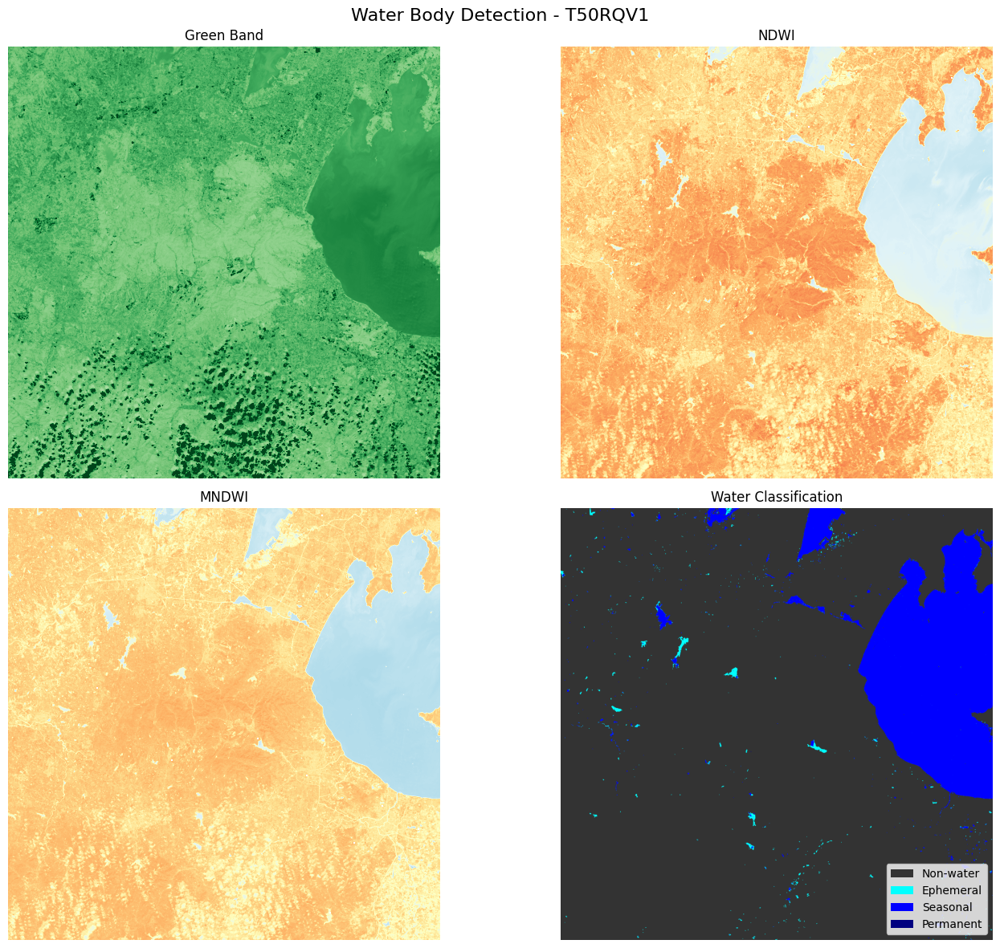

Water detection completed successfully
Done!


In [24]:
import rasterio
import numpy as np
import matplotlib.pyplot as plt
import os
from scipy import ndimage

def find_water_band_files(base_path):
    """
    Find band files needed for water detection (Green, NIR, SWIR)
    """
    band_files = {}
    
    for root, dirs, files in os.walk(base_path):
        for file in files:
            if file.endswith('.jp2'):
                file_path = os.path.join(root, file)
                
                if 'B03' in file and '10m' in file:
                    band_files['green_10m'] = file_path
                elif 'B08' in file and '10m' in file:
                    band_files['nir_10m'] = file_path
                elif 'B11' in file and '20m' in file:
                    band_files['swir1_20m'] = file_path
    
    return band_files

def read_and_resample_raster(file_path, target_shape=None, scale_factor=0.25):
    """
    Read raster file and resample to target shape if needed
    """
    with rasterio.open(file_path) as src:
        if target_shape is None:
            data = src.read(
                1,
                out_shape=(
                    src.count,
                    int(src.height * scale_factor),
                    int(src.width * scale_factor)
                ),
                resampling=rasterio.enums.Resampling.average
            )
        else:
            data = src.read(
                1,
                out_shape=target_shape,
                resampling=rasterio.enums.Resampling.average
            )
        print(f"Read file: {os.path.basename(file_path)} - Shape: {data.shape}")
        return data

def calculate_ndwi(green_band, nir_band):
    """
    Calculate NDWI (Normalized Difference Water Index)
    """
    valid_mask = (~np.isnan(green_band)) & (~np.isnan(nir_band)) & (green_band > 0) & (nir_band > 0)
    
    ndwi = np.full_like(green_band, dtype=np.float32, fill_value=np.nan)
    
    green_valid = green_band[valid_mask]
    nir_valid = nir_band[valid_mask]
    
    denominator = green_valid + nir_valid + 1e-8
    ndwi_valid = (green_valid - nir_valid) / denominator
    
    ndwi[valid_mask] = ndwi_valid
    
    return ndwi

def calculate_mndwi(green_band, swir_band):
    """
    Calculate MNDWI (Modified Normalized Difference Water Index)
    """
    valid_mask = (~np.isnan(green_band)) & (~np.isnan(swir_band)) & (green_band > 0) & (swir_band > 0)
    
    mndwi = np.full_like(green_band, dtype=np.float32, fill_value=np.nan)
    
    green_valid = green_band[valid_mask]
    swir_valid = swir_band[valid_mask]
    
    denominator = green_valid + swir_valid + 1e-8
    mndwi_valid = (green_valid - swir_valid) / denominator
    
    mndwi[valid_mask] = mndwi_valid
    
    return mndwi

def create_water_masks(ndwi, mndwi):
    """
    Apply thresholds to create water masks
    """
    ndwi_water_mask = np.where(np.isnan(ndwi), False, ndwi > 0.0)
    mndwi_water_mask = np.where(np.isnan(mndwi), False, mndwi > 0.3)
    
    combined_water_mask = mndwi_water_mask | (ndwi_water_mask & (np.where(np.isnan(mndwi), False, mndwi > 0.1)))
    
    # Clean small objects
    structure = np.ones((3, 3), dtype=bool)
    cleaned_mask = ndimage.binary_opening(combined_water_mask, structure=structure)
    
    print(f"Water pixels detected: {np.sum(cleaned_mask):,}")
    
    return {
        'ndwi_mask': ndwi_water_mask,
        'mndwi_mask': mndwi_water_mask,
        'combined_mask': cleaned_mask
    }

def classify_water_bodies(water_mask, ndwi, mndwi):
    """
    Classify water bodies by permanence
    """
    water_classes = np.zeros_like(water_mask, dtype=np.int8)
    
    if np.sum(water_mask) == 0:
        return water_classes
    
    # Get water pixel values
    water_indices = np.where(water_mask)
    water_ndwi = ndwi[water_mask]
    water_mndwi = mndwi[water_mask]
    
    # Simple classification based on index values
    for i, (ndwi_val, mndwi_val) in enumerate(zip(water_ndwi, water_mndwi)):
        if not np.isnan(ndwi_val) and not np.isnan(mndwi_val):
            if mndwi_val > 0.4 and ndwi_val > 0.4:
                water_classes[water_indices[0][i], water_indices[1][i]] = 3  # Permanent
            elif mndwi_val > 0.2:
                water_classes[water_indices[0][i], water_indices[1][i]] = 2  # Seasonal
            else:
                water_classes[water_indices[0][i], water_indices[1][i]] = 1  # Ephemeral
    
    return water_classes

def calculate_water_area(water_masks, water_classes, pixel_size=10):
    """
    Calculate total water area and percentages
    """
    pixel_area_ha = (pixel_size * pixel_size) / 10000.0
    
    combined_mask = water_masks['combined_mask']
    total_pixels = combined_mask.size
    total_area_ha = total_pixels * pixel_area_ha
    
    combined_area = np.sum(combined_mask) * pixel_area_ha
    
    # Calculate areas for each class
    permanent_area = np.sum(water_classes == 3) * pixel_area_ha
    seasonal_area = np.sum(water_classes == 2) * pixel_area_ha
    ephemeral_area = np.sum(water_classes == 1) * pixel_area_ha
    
    print(f"Total study area: {total_area_ha:,.1f} ha")
    print(f"Combined water area: {combined_area:,.1f} ha ({combined_area/total_area_ha*100:.2f}%)")
    print(f"Permanent water: {permanent_area:,.1f} ha")
    print(f"Seasonal water: {seasonal_area:,.1f} ha")
    print(f"Ephemeral water: {ephemeral_area:,.1f} ha")
    
    return {
        'total_area_ha': total_area_ha,
        'combined_area_ha': combined_area,
        'permanent_area_ha': permanent_area,
        'seasonal_area_ha': seasonal_area,
        'ephemeral_area_ha': ephemeral_area
    }

def create_water_detection_plots(green_band, ndwi, mndwi, water_masks, water_classes, product_name):
    """
    Create visualization of water detection results
    """
    fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(15, 12))
    fig.suptitle(f'Water Body Detection - {product_name}', fontsize=16)
    
    # Plot 1: Green band
    ax1.imshow(green_band, cmap='Greens', vmin=0, vmax=0.3)
    ax1.set_title('Green Band')
    ax1.axis('off')
    
    # Plot 2: NDWI
    ax2.imshow(ndwi, cmap='RdYlBu', vmin=-1, vmax=1)
    ax2.set_title('NDWI')
    ax2.axis('off')
    
    # Plot 3: MNDWI
    ax3.imshow(mndwi, cmap='RdYlBu', vmin=-1, vmax=1)
    ax3.set_title('MNDWI')
    ax3.axis('off')
    
    # Plot 4: Water classification
    # Create RGB image for classification
    classified_rgb = np.zeros((*water_classes.shape, 3), dtype=np.float32)
    
    # Colors: non-water = dark gray, ephemeral = cyan, seasonal = blue, permanent = dark blue
    classified_rgb[water_classes == 0] = [0.2, 0.2, 0.2]  # Non-water
    classified_rgb[water_classes == 1] = [0, 1, 1]        # Ephemeral - cyan
    classified_rgb[water_classes == 2] = [0, 0, 1]        # Seasonal - blue
    classified_rgb[water_classes == 3] = [0, 0, 0.5]      # Permanent - dark blue
    
    ax4.imshow(classified_rgb)
    ax4.set_title('Water Classification')
    ax4.axis('off')
    
    # Add legend
    legend_elements = [
        plt.Rectangle((0,0),1,1, facecolor=[0.2,0.2,0.2], label='Non-water'),
        plt.Rectangle((0,0),1,1, facecolor=[0,1,1], label='Ephemeral'),
        plt.Rectangle((0,0),1,1, facecolor=[0,0,1], label='Seasonal'),
        plt.Rectangle((0,0),1,1, facecolor=[0,0,0.5], label='Permanent')
    ]
    ax4.legend(handles=legend_elements, loc='lower right')
    
    plt.tight_layout()
    plt.show()
    
    return fig

def process_water_detection(base_path, product_name, scale_factor=0.25):
    """
    Main function for water detection
    """
    print(f"Water Detection - {product_name}")
    print("=" * 50)
    
    try:
        # Find band files
        band_files = find_water_band_files(base_path)
        
        if 'green_10m' not in band_files or 'nir_10m' not in band_files:
            print("Required bands not found")
            return None
        
        # Read bands
        green_10m = read_and_resample_raster(band_files['green_10m'], scale_factor=scale_factor)
        nir_10m = read_and_resample_raster(band_files['nir_10m'], scale_factor=scale_factor)
        
        target_shape = green_10m.shape
        
        # Read SWIR if available
        if 'swir1_20m' in band_files:
            swir1_20m = read_and_resample_raster(band_files['swir1_20m'], target_shape=target_shape)
        else:
            swir1_20m = nir_10m.copy()
        
        # Normalize
        green_normalized = green_10m.astype(np.float32) / 10000.0
        nir_normalized = nir_10m.astype(np.float32) / 10000.0
        swir1_normalized = swir1_20m.astype(np.float32) / 10000.0
        
        # Calculate indices
        ndwi = calculate_ndwi(green_normalized, nir_normalized)
        mndwi = calculate_mndwi(green_normalized, swir1_normalized)
        
        # Create masks
        water_masks = create_water_masks(ndwi, mndwi)
        
        # Classify
        water_classes = classify_water_bodies(water_masks['combined_mask'], ndwi, mndwi)
        
        # Calculate areas
        area_stats = calculate_water_area(water_masks, water_classes)
        
        # Create plots
        fig = create_water_detection_plots(green_normalized, ndwi, mndwi, water_masks, water_classes, product_name)
        
        results = {
            'ndwi': ndwi,
            'mndwi': mndwi,
            'water_masks': water_masks,
            'water_classes': water_classes,
            'area_stats': area_stats
        }
        
        print("Water detection completed successfully")
        return results
        
    except Exception as e:
        print(f"Error: {e}")
        return None

def main():
    """
    Main execution function
    """
    products = [
        {
            'name': 'T50RQV1',
            'base_path': r"data\S2C_MSIL2A_20251113T024511_N0511_R089_T50RQV_20251113T054013.SAFE\GRANULE\L2A_T50RQV_A006208_20251113T024512\IMG_DATA"
        },
        #{
        #    'name': 'T51RTQ1',
        #    'base_path': r"data\S2C_MSIL1C_20251113T024511_N0511_R089_T51RTQ_20251113T035440.SAFE\GRANULE\L1C_T51RTQ_A006208_20251113T024512\IMG_DATA"
        #},
        {
            'name': 'T50RQV2',
            'base_path': r"data\S2C_MSIL2A_20251113T024511_N0511_R089_T50RQV_20251113T054013.SAFE\GRANULE\L2A_T50RQV_A006208_20251113T024512\IMG_DATA"
        },
        #{
        #    'name': 'T51RTQ2',
        #    'base_path': r"data\S2C_MSIL2A_20251113T024511_N0511_R089_T51RTQ_20251113T054013.SAFE\GRANULE\L2A_T50RQV_A006208_20251113T024512\IMG_DATA"
        #},
    ]
    
    product = products[0]
    
    if not os.path.exists(product['base_path']):
        print(f"Path does not exist: {product['base_path']}")
        return
    
    results = process_water_detection(product['base_path'], product['name'])
    
    if results is not None:
        print("Done!")
    else:
        print("Failed")

if __name__ == "__main__":
    main()


# PHASE 7 — Water Flow Regulation Analysis

Using biomass and vegetation density, the capacity for water flow regulation is assessed.

Dense and medium-density vegetation improves:

- Flow attenuation  
- Storage capacity  
- Reduction of peak flows  

Outputs may include:

- Water regulation index  
- Vegetation distribution maps related to hydrology




PHASE 7: Water Quality Assessment - T50RQV1
Creating water mask...
Created water mask with 1,135,837 water pixels
Loading bands for quality assessment...
Calculating water quality indices...
NDTI Statistics:
  Range: -1.000 to 1.000
  Mean: -0.021
Classifying water quality...

Water Quality Statistics:
Total water pixels: 1,135,837
Healthy: 1,135,616 (100.0%)
Moderate: 6 (0.0%)
Degraded: 215 (0.0%)
Creating water quality plots...


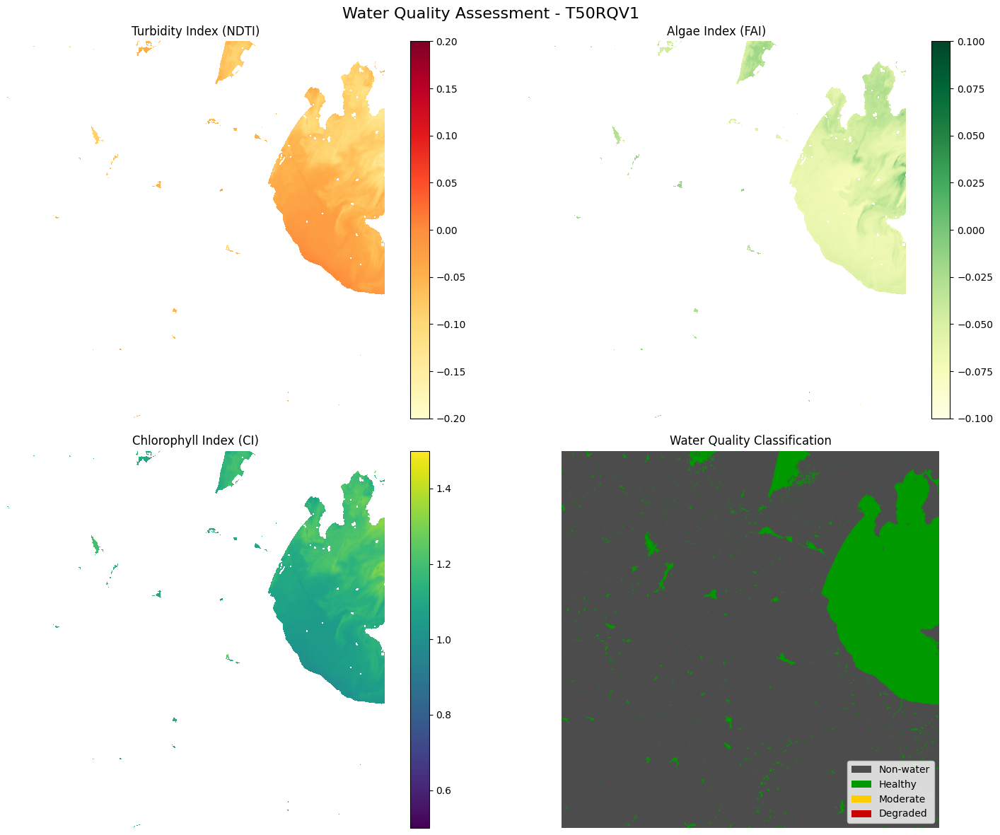

Water quality assessment completed successfully!
All done! Water quality assessment completed.


In [25]:
import rasterio
import numpy as np
import matplotlib.pyplot as plt
import os
from scipy import ndimage

def find_bands_for_quality(base_path):
    """Find bands needed for water quality assessment"""
    band_files = {}
    
    for root, dirs, files in os.walk(base_path):
        for file in files:
            if file.endswith('.jp2'):
                file_path = os.path.join(root, file)
                if 'B04' in file and '10m' in file:
                    band_files['red_10m'] = file_path
                elif 'B03' in file and '10m' in file:
                    band_files['green_10m'] = file_path
                elif 'B08' in file and '10m' in file:
                    band_files['nir_10m'] = file_path
                elif 'B02' in file and '10m' in file:
                    band_files['blue_10m'] = file_path
    
    return band_files

def read_raster_simple(file_path, scale_factor=0.25):
    """Simple raster reading function"""
    with rasterio.open(file_path) as src:
        data = src.read(
            1,
            out_shape=(
                src.count,
                int(src.height * scale_factor),
                int(src.width * scale_factor)
            ),
            resampling=rasterio.enums.Resampling.average
        )
        return data

def create_water_mask_simple(base_path, scale_factor=0.25):
    """Create a simple water mask for testing"""
    band_files = {}
    
    for root, dirs, files in os.walk(base_path):
        for file in files:
            if file.endswith('.jp2'):
                file_path = os.path.join(root, file)
                if 'B03' in file and '10m' in file:
                    band_files['green_10m'] = file_path
                elif 'B08' in file and '10m' in file:
                    band_files['nir_10m'] = file_path
    
    if 'green_10m' not in band_files or 'nir_10m' not in band_files:
        print("Required bands for water detection not found")
        return None
    
    green = read_raster_simple(band_files['green_10m'], scale_factor)
    nir = read_raster_simple(band_files['nir_10m'], scale_factor)
    
    # Normalize
    green_norm = green.astype(np.float32) / 10000.0
    nir_norm = nir.astype(np.float32) / 10000.0
    
    # Simple NDWI calculation
    ndwi = (green_norm - nir_norm) / (green_norm + nir_norm + 1e-8)
    
    # Simple water mask
    water_mask = (ndwi > 0.0) & (~np.isnan(ndwi))
    
    # Clean small objects
    structure = np.ones((3, 3), dtype=bool)
    water_mask = ndimage.binary_opening(water_mask, structure=structure)
    
    print(f"Created water mask with {np.sum(water_mask):,} water pixels")
    return water_mask

def calculate_ndti(red_band, green_band):
    """
    Task 7.1: Calculate Normalized Difference Turbidity Index (NDTI)
    Formula: NDTI = (Red - Green) / (Red + Green)
    """
    valid_mask = (~np.isnan(red_band)) & (~np.isnan(green_band))
    
    ndti = np.full_like(red_band, dtype=np.float32, fill_value=np.nan)
    
    red_valid = red_band[valid_mask]
    green_valid = green_band[valid_mask]
    
    denominator = red_valid + green_valid + 1e-8
    ndti_valid = (red_valid - green_valid) / denominator
    
    ndti[valid_mask] = ndti_valid
    
    # Print statistics
    valid_ndti = ndti_valid[~np.isnan(ndti_valid)]
    if len(valid_ndti) > 0:
        print(f"NDTI Statistics:")
        print(f"  Range: {np.min(valid_ndti):.3f} to {np.max(valid_ndti):.3f}")
        print(f"  Mean: {np.mean(valid_ndti):.3f}")
    
    return ndti

def calculate_water_quality_indices(red_band, green_band, nir_band, blue_band=None):
    """
    Calculate water quality indices
    """
    indices = {}
    
    # NDTI - Turbidity
    indices['ndti'] = calculate_ndti(red_band, green_band)
    
    # FAI - Floating Algae Index
    valid_mask = (~np.isnan(nir_band)) & (~np.isnan(red_band))
    fai = np.full_like(nir_band, dtype=np.float32, fill_value=np.nan)
    nir_valid = nir_band[valid_mask]
    red_valid = red_band[valid_mask]
    fai_valid = nir_valid - red_valid
    fai[valid_mask] = fai_valid
    indices['fai'] = fai
    
    # Chlorophyll Index (simple ratio)
    valid_mask = (~np.isnan(green_band)) & (~np.isnan(red_band)) & (red_band > 0)
    ci = np.full_like(green_band, dtype=np.float32, fill_value=np.nan)
    green_valid = green_band[valid_mask]
    red_valid = red_band[valid_mask]
    ci_valid = green_valid / (red_valid + 1e-8)
    ci[valid_mask] = ci_valid
    indices['ci'] = ci
    
    return indices

def classify_water_quality(water_mask, ndti, fai, ci):
    """
    Task 7.3: Identify degraded vs. healthy water bodies
    """
    quality_classes = np.zeros_like(water_mask, dtype=np.int8)
    
    if np.sum(water_mask) == 0:
        print("No water pixels found for quality classification")
        return quality_classes
    
    water_pixels = np.where(water_mask)
    
    for i in range(len(water_pixels[0])):
        row, col = water_pixels[0][i], water_pixels[1][i]
        
        ndti_val = ndti[row, col]
        fai_val = fai[row, col]
        ci_val = ci[row, col]
        
        if np.isnan(ndti_val) or np.isnan(fai_val) or np.isnan(ci_val):
            continue
            
        # Classification logic
        if ndti_val > 0.1 or fai_val > 0.05:  # High turbidity or algae
            quality_classes[row, col] = 3  # Degraded
        elif ndti_val > 0.05:  # Moderate turbidity
            quality_classes[row, col] = 2  # Moderate
        else:  # Good conditions
            quality_classes[row, col] = 1  # Healthy
    
    return quality_classes

def create_water_quality_plots(water_mask, ndti, fai, ci, quality_classes, product_name):
    """
    Task 7.2: Create water quality maps
    """
    fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(15, 12))
    fig.suptitle(f'Water Quality Assessment - {product_name}', fontsize=16)
    
    # Plot 1: Turbidity (NDTI)
    ndti_water = np.where(water_mask, ndti, np.nan)
    im1 = ax1.imshow(ndti_water, cmap='YlOrRd', vmin=-0.2, vmax=0.2)
    ax1.set_title('Turbidity Index (NDTI)')
    ax1.axis('off')
    plt.colorbar(im1, ax=ax1)
    
    # Plot 2: Algae Index (FAI)
    fai_water = np.where(water_mask, fai, np.nan)
    im2 = ax2.imshow(fai_water, cmap='YlGn', vmin=-0.1, vmax=0.1)
    ax2.set_title('Algae Index (FAI)')
    ax2.axis('off')
    plt.colorbar(im2, ax=ax2)
    
    # Plot 3: Chlorophyll Index (CI)
    ci_water = np.where(water_mask, ci, np.nan)
    im3 = ax3.imshow(ci_water, cmap='viridis', vmin=0.5, vmax=1.5)
    ax3.set_title('Chlorophyll Index (CI)')
    ax3.axis('off')
    plt.colorbar(im3, ax=ax3)
    
    # Plot 4: Quality Classification
    quality_rgb = np.zeros((*quality_classes.shape, 3), dtype=np.float32)
    quality_rgb[quality_classes == 0] = [0.3, 0.3, 0.3]  # Non-water
    quality_rgb[quality_classes == 1] = [0, 0.6, 0]      # Healthy
    quality_rgb[quality_classes == 2] = [1, 0.8, 0]      # Moderate  
    quality_rgb[quality_classes == 3] = [0.8, 0, 0]      # Degraded
    
    ax4.imshow(quality_rgb)
    ax4.set_title('Water Quality Classification')
    ax4.axis('off')
    
    # Legend
    legend_elements = [
        plt.Rectangle((0,0),1,1, facecolor=[0.3,0.3,0.3], label='Non-water'),
        plt.Rectangle((0,0),1,1, facecolor=[0,0.6,0], label='Healthy'),
        plt.Rectangle((0,0),1,1, facecolor=[1,0.8,0], label='Moderate'),
        plt.Rectangle((0,0),1,1, facecolor=[0.8,0,0], label='Degraded')
    ]
    ax4.legend(handles=legend_elements, loc='lower right')
    
    plt.tight_layout()
    plt.show()
    
    return fig

def calculate_quality_statistics(water_mask, quality_classes):
    """Calculate water quality statistics"""
    if np.sum(water_mask) == 0:
        return
    
    total_water = np.sum(water_mask)
    healthy = np.sum(quality_classes == 1)
    moderate = np.sum(quality_classes == 2)
    degraded = np.sum(quality_classes == 3)
    
    print(f"\nWater Quality Statistics:")
    print(f"Total water pixels: {total_water:,}")
    print(f"Healthy: {healthy:,} ({healthy/total_water*100:.1f}%)")
    print(f"Moderate: {moderate:,} ({moderate/total_water*100:.1f}%)")
    print(f"Degraded: {degraded:,} ({degraded/total_water*100:.1f}%)")

def process_water_quality_assessment(base_path, product_name, scale_factor=0.25):
    """
    Complete water quality assessment workflow
    """
    print(f"PHASE 7: Water Quality Assessment - {product_name}")
    print("=" * 50)
    
    try:
        # Step 1: Create water mask
        print("Creating water mask...")
        water_mask = create_water_mask_simple(base_path, scale_factor)
        if water_mask is None:
            print("Failed to create water mask")
            return None
        
        # Step 2: Find bands for quality assessment
        print("Loading bands for quality assessment...")
        band_files = find_bands_for_quality(base_path)
        
        required_bands = ['red_10m', 'green_10m', 'nir_10m']
        if not all(band in band_files for band in required_bands):
            print("Missing required bands for quality assessment")
            return None
        
        # Step 3: Read and normalize bands
        red = read_raster_simple(band_files['red_10m'], scale_factor)
        green = read_raster_simple(band_files['green_10m'], scale_factor)
        nir = read_raster_simple(band_files['nir_10m'], scale_factor)
        
        red_norm = red.astype(np.float32) / 10000.0
        green_norm = green.astype(np.float32) / 10000.0
        nir_norm = nir.astype(np.float32) / 10000.0
        
        # Step 4: Calculate quality indices
        print("Calculating water quality indices...")
        quality_indices = calculate_water_quality_indices(red_norm, green_norm, nir_norm)
        
        # Step 5: Classify water quality
        print("Classifying water quality...")
        quality_classes = classify_water_quality(
            water_mask, 
            quality_indices['ndti'],
            quality_indices['fai'],
            quality_indices['ci']
        )
        
        # Step 6: Calculate statistics
        calculate_quality_statistics(water_mask, quality_classes)
        
        # Step 7: Create plots
        print("Creating water quality plots...")
        fig = create_water_quality_plots(
            water_mask,
            quality_indices['ndti'],
            quality_indices['fai'], 
            quality_indices['ci'],
            quality_classes,
            product_name
        )
        
        results = {
            'water_mask': water_mask,
            'quality_indices': quality_indices,
            'quality_classes': quality_classes,
            'fig': fig
        }
        
        print("Water quality assessment completed successfully!")
        return results
        
    except Exception as e:
        print(f"Error in water quality assessment: {e}")
        return None

def main():
    """Main function"""
    products = [
        {
            'name': 'T50RQV1',
            'base_path': r"data\S2C_MSIL2A_20251113T024511_N0511_R089_T50RQV_20251113T054013.SAFE\GRANULE\L2A_T50RQV_A006208_20251113T024512\IMG_DATA"
        },
        #{
        #    'name': 'T51RTQ1',
        #    'base_path': r"data\S2C_MSIL1C_20251113T024511_N0511_R089_T51RTQ_20251113T035440.SAFE\GRANULE\L1C_T51RTQ_A006208_20251113T024512\IMG_DATA"
        #},
        {
            'name': 'T50RQV2',
            'base_path': r"data\S2C_MSIL2A_20251113T024511_N0511_R089_T50RQV_20251113T054013.SAFE\GRANULE\L2A_T50RQV_A006208_20251113T024512\IMG_DATA"
        },
        #{
        #    'name': 'T51RTQ2',
        #    'base_path': r"data\S2C_MSIL2A_20251113T024511_N0511_R089_T51RTQ_20251113T054013.SAFE\GRANULE\L2A_T50RQV_A006208_20251113T024512\IMG_DATA"
        #},
    ]
    
    product = products[0]
    
    if not os.path.exists(product['base_path']):
        print(f"Path does not exist: {product['base_path']}")
        return
    
    # Run water quality assessment
    results = process_water_quality_assessment(product['base_path'], product['name'])
    
    if results is not None:
        print("All done! Water quality assessment completed.")
    else:
        print("Water quality assessment failed.")

if __name__ == "__main__":
    main()


# PHASE 8 — Water Purification, Sediment Control, and Aquifer Recharge

Based on biomass density classes:

- Low biomass: limited filtering and retention  
- Medium biomass: good infiltration and moderate filtering  
- High biomass: strong sediment retention, filtering, and aquifer recharge  

Indicators include:

- Water purification index  
- Sediment control index  
- Aquifer recharge index  

These are derived from pixel counts of biomass density classes.



Loading NDVI data...
NDVI data loaded: (1098, 1098) (reduced resolution for speed)
Creating water mask...
Water mask created: 169904 water pixels
PHASE 8: Hydrological Analysis - T50RQV1
Creating riparian buffer zones...
Buffer Statistics:
  Water area: 1699.0 ha
  Inner buffer (0-30m): 172.2 ha
  Middle buffer (30-100m): 456.5 ha
  Outer buffer (100-300m): 1787.0 ha
Calculating ecosystem service metrics...
  Calculating Water Flow Regulation...
  Calculating Water Purification...
  Calculating Sediment Control...
  Calculating Aquifer Recharge...
  Calculating Flood Protection...
Ecosystem service metrics calculated successfully
Assessing wetland connectivity (fast method)...
  Found 111 water bodies
  Average connectivity score: 100.0/100
Identifying priority conservation areas...
  High priority threshold: 0.0/100
  High priority area: 0 pixels
Creating ecosystem service maps...


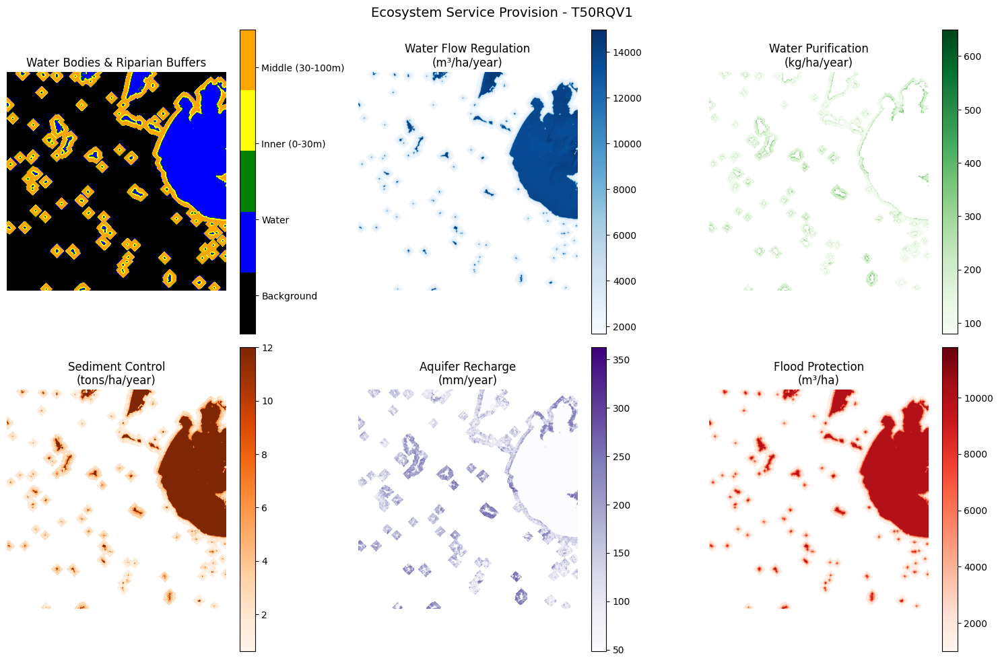


Ecosystem Service Summary:
  water_flow_regulation Total: 3004887040, Area: 4114.8 ha
  water_purification   Total:   36891864, Area: 2415.7 ha
  sediment_control     Total:    2572698, Area: 4114.8 ha
  aquifer_recharge     Total:   44344540, Area: 4114.8 ha
  flood_protection     Total: 2293107200, Area: 4114.8 ha
Hydrological analysis completed successfully!
Hydrological analysis completed successfully!


In [26]:
import numpy as np
import matplotlib.pyplot as plt
from scipy import ndimage
import os
import rasterio

def create_riparian_buffers(water_mask, distances=[30, 100, 300], pixel_size=10):
    """
    Task 8.1: Create riparian buffer zones around water bodies
    """
    print("Creating riparian buffer zones...")
    
    # Convert distances from meters to pixels
    distances_pixels = [max(1, int(d / pixel_size)) for d in distances]
    
    buffers = {}
    
    # Create buffers using binary dilation
    structure = ndimage.generate_binary_structure(2, 1)  # Simpler structure for faster processing
    
    # Inner buffer (0-30m)
    inner_buffer = ndimage.binary_dilation(water_mask, structure=structure, iterations=distances_pixels[0])
    inner_buffer = inner_buffer & ~water_mask
    buffers['inner'] = inner_buffer
    
    # Middle buffer (30-100m) - build on inner buffer
    middle_buffer = ndimage.binary_dilation(inner_buffer, structure=structure, 
                                          iterations=distances_pixels[1]-distances_pixels[0])
    middle_buffer = middle_buffer & ~inner_buffer & ~water_mask
    buffers['middle'] = middle_buffer
    
    # Outer buffer (100-300m) - build on middle buffer
    outer_buffer = ndimage.binary_dilation(middle_buffer, structure=structure, 
                                         iterations=distances_pixels[2]-distances_pixels[1])
    outer_buffer = outer_buffer & ~middle_buffer & ~inner_buffer & ~water_mask
    buffers['outer'] = outer_buffer
    
    # Calculate statistics
    total_water_pixels = np.sum(water_mask)
    inner_pixels = np.sum(inner_buffer)
    middle_pixels = np.sum(middle_buffer)
    outer_pixels = np.sum(outer_buffer)
    
    print(f"Buffer Statistics:")
    print(f"  Water area: {total_water_pixels * pixel_size**2 / 10000:.1f} ha")
    print(f"  Inner buffer (0-30m): {inner_pixels * pixel_size**2 / 10000:.1f} ha")
    print(f"  Middle buffer (30-100m): {middle_pixels * pixel_size**2 / 10000:.1f} ha")
    print(f"  Outer buffer (100-300m): {outer_pixels * pixel_size**2 / 10000:.1f} ha")
    
    return buffers

def calculate_ecosystem_services(water_mask, ndvi_data, buffers, pixel_size=10):
    """
    Calculate biophysical metrics for 5 ecosystem services based on scientific literature
    """
    print("Calculating ecosystem service metrics...")
    
    metrics = {}
    area_per_pixel_ha = (pixel_size ** 2) / 10000
    
    # Combine all buffer zones for service calculations
    all_buffers = buffers['inner'] | buffers['middle'] | buffers['outer']
    riparian_areas = all_buffers | water_mask
    
    # 8.1 Water Flow Regulation - Water storage capacity (m³/ha/year)
    print("  Calculating Water Flow Regulation...")
    flow_regulation = np.zeros_like(water_mask, dtype=np.float32)
    
    # Different storage capacities based on land type
    flow_regulation[water_mask] = 1.5  # Wetlands: 1.5m depth
    flow_regulation[buffers['inner']] = 0.5  # Riparian: 0.5m depth
    flow_regulation[buffers['middle']] = 0.3
    flow_regulation[buffers['outer']] = 0.2
    
    # Apply vegetation factor: 1.0 + (NDVI × 0.5)
    vegetation_factor = 1.0 + (ndvi_data * 0.5)
    flow_regulation = flow_regulation * vegetation_factor * 10000  # Convert to m³/ha
    
    # Apply only in relevant areas
    flow_regulation = flow_regulation * riparian_areas
    metrics['water_flow_regulation'] = flow_regulation
    
    # 8.2 Water Purification - Pollutant removal (kg/ha/year)
    print("  Calculating Water Purification...")
    purification = np.zeros_like(water_mask, dtype=np.float32)
    
    # Base filtration rate with NDVI scaling
    base_filtration = 800  # kg/ha/yr baseline
    vegetation_quality = np.clip(ndvi_data, 0.2, 1.0)  # NDVI-based multiplier (0.2-1.0)
    
    # Higher purification in water edges and vegetated buffers
    water_edges = ndimage.binary_dilation(water_mask) & ~water_mask
    purification[water_edges] = base_filtration * vegetation_quality[water_edges] * 1.5
    purification[buffers['inner']] = base_filtration * vegetation_quality[buffers['inner']] * 1.2
    purification[buffers['middle']] = base_filtration * vegetation_quality[buffers['middle']] * 0.8
    purification[buffers['outer']] = base_filtration * vegetation_quality[buffers['outer']] * 0.5
    
    metrics['water_purification'] = purification
    
    # 8.3 Sediment Control - Sediment retention (tons/ha/year)
    print("  Calculating Sediment Control...")
    sediment_control = np.zeros_like(water_mask, dtype=np.float32)
    
    # Simplified approach: 15 × NDVI × Buffer_Width_Factor
    buffer_factors = {
        'inner': 1.0,
        'middle': 0.7, 
        'outer': 0.4
    }
    
    for zone, factor in buffer_factors.items():
        zone_mask = buffers[zone]
        sediment_control[zone_mask] = 15 * np.clip(ndvi_data[zone_mask], 0.1, 1.0) * factor
    
    # Water bodies also provide sediment control
    sediment_control[water_mask] = 15 * 0.8  # Moderate NDVI assumption for water
    
    metrics['sediment_control'] = sediment_control
    
    # 8.4 Aquifer Recharge - Groundwater recharge potential (mm/year)
    print("  Calculating Aquifer Recharge...")
    aquifer_recharge = np.zeros_like(water_mask, dtype=np.float32)
    
    # Assume regional precipitation (simplified)
    annual_precipitation = 800  # mm/year (regional average)
    
    # Infiltration rates based on land cover (NDVI as proxy)
    infiltration_rate = 0.3 + (ndvi_data * 0.5)  # 0.3-0.8 range
    infiltration_rate = np.clip(infiltration_rate, 0.3, 0.8)
    
    # Runoff coefficient decreases with better vegetation
    runoff_coefficient = 0.8 - (ndvi_data * 0.7)  # 0.1-0.8 range
    runoff_coefficient = np.clip(runoff_coefficient, 0.1, 0.8)
    
    # Recharge calculation
    aquifer_recharge = annual_precipitation * infiltration_rate * (1 - runoff_coefficient)
    
    # Apply only in relevant areas
    aquifer_recharge = aquifer_recharge * riparian_areas
    metrics['aquifer_recharge'] = aquifer_recharge
    
    # 8.5 Flood Protection - Flood storage capacity (m³) and protection value
    print("  Calculating Flood Protection...")
    flood_protection = np.zeros_like(water_mask, dtype=np.float32)
    
    # Storage depths based on ecosystem type
    storage_depths = {
        'water': 2.0,      # 2m depth for water bodies
        'inner': 1.0,      # 1m depth for inner buffer
        'middle': 0.5,     # 0.5m depth for middle buffer  
        'outer': 0.2       # 0.2m depth for outer buffer
    }
    
    # Roughness factor based on NDVI (0.5-1.5)
    roughness_factor = 0.5 + ndvi_data  # NDVI ranges -0.2 to 0.8 -> 0.3 to 1.3
    roughness_factor = np.clip(roughness_factor, 0.5, 1.5)
    
    # Calculate flood storage capacity
    flood_protection[water_mask] = storage_depths['water'] * roughness_factor[water_mask] * 10000  # m³/ha
    flood_protection[buffers['inner']] = storage_depths['inner'] * roughness_factor[buffers['inner']] * 10000
    flood_protection[buffers['middle']] = storage_depths['middle'] * roughness_factor[buffers['middle']] * 10000
    flood_protection[buffers['outer']] = storage_depths['outer'] * roughness_factor[buffers['outer']] * 10000
    
    metrics['flood_protection'] = flood_protection
    
    print("Ecosystem service metrics calculated successfully")
    return metrics

def assess_wetland_connectivity_fast(water_mask, pixel_size=10):
    """
    Fast wetland connectivity assessment using distance transforms
    """
    print("Assessing wetland connectivity (fast method)...")
    
    # Clean water mask
    structure = np.ones((3, 3), dtype=bool)
    cleaned_water = ndimage.binary_opening(water_mask, structure=structure)
    
    # Label water bodies
    labeled_water, num_features = ndimage.label(cleaned_water)
    
    print(f"  Found {num_features} water bodies")
    
    if num_features == 0:
        return None, None
    
    # Use distance transform for connectivity assessment
    distance_to_water = ndimage.distance_transform_edt(~cleaned_water)
    
    # Simple connectivity score based on proximity
    max_distance = 500  # 5km maximum search distance
    connectivity_score = np.maximum(0, 100 - (distance_to_water / max_distance * 100))
    
    # Only score water areas
    connectivity_map = np.where(cleaned_water, connectivity_score, 0)
    
    # Calculate basic statistics
    if num_features > 0:
        avg_connectivity = np.mean(connectivity_map[cleaned_water])
        print(f"  Average connectivity score: {avg_connectivity:.1f}/100")
    
    return connectivity_map, labeled_water

def identify_priority_areas_fast(buffers, ndvi_data, connectivity_map):
    """
    Fast priority area identification
    """
    print("Identifying priority conservation areas...")
    
    # Combine all buffers
    all_buffers = buffers['inner'] | buffers['middle'] | buffers['outer']
    
    # Priority score based on:
    # - Buffer zone (inner > middle > outer)
    # - Vegetation quality (NDVI)
    # - Connectivity
    
    priority_map = np.zeros_like(ndvi_data, dtype=np.float32)
    
    # Zone weights
    zone_weights = {'inner': 1.0, 'middle': 0.7, 'outer': 0.4}
    
    for zone, weight in zone_weights.items():
        zone_mask = buffers[zone]
        # Score = zone weight × NDVI × connectivity
        zone_priority = weight * np.clip(ndvi_data[zone_mask], 0, 1)
        if connectivity_map is not None:
            zone_priority *= (connectivity_map[zone_mask] / 100)
        priority_map[zone_mask] = np.maximum(priority_map[zone_mask], zone_priority)
    
    # Normalize to 0-100 scale
    if np.max(priority_map) > 0:
        priority_map = (priority_map / np.max(priority_map)) * 100
    
    # Identify high priority areas (top 25%)
    priority_values = priority_map[priority_map > 0]
    if len(priority_values) > 0:
        high_priority_threshold = np.percentile(priority_values, 75)
        high_priority_mask = priority_map >= high_priority_threshold
    else:
        high_priority_threshold = 0
        high_priority_mask = np.zeros_like(priority_map, dtype=bool)
    
    print(f"  High priority threshold: {high_priority_threshold:.1f}/100")
    print(f"  High priority area: {np.sum(high_priority_mask)} pixels")
    
    return priority_map, high_priority_mask

def create_service_maps(metrics, buffers, water_mask, product_name):
    """
    Create maps showing ecosystem service provision
    """
    print("Creating ecosystem service maps...")
    
    fig, axes = plt.subplots(2, 3, figsize=(15, 10))
    fig.suptitle(f'Ecosystem Service Provision - {product_name}', fontsize=14)
    
    # Plot 1: Water Bodies and Buffers
    buffer_display = np.zeros_like(water_mask, dtype=np.int8)
    buffer_display[water_mask] = 1
    buffer_display[buffers['inner']] = 2
    buffer_display[buffers['middle']] = 3
    buffer_display[buffers['outer']] = 4
    
    cmap1 = plt.cm.colors.ListedColormap(['black', 'blue', 'green', 'yellow', 'orange'])
    im1 = axes[0,0].imshow(buffer_display, cmap=cmap1, vmin=0, vmax=4)
    axes[0,0].set_title('Water Bodies & Riparian Buffers')
    axes[0,0].axis('off')
    cbar1 = plt.colorbar(im1, ax=axes[0,0], ticks=[0.5, 1.5, 2.5, 3.5, 4.5])
    cbar1.set_ticklabels(['Background', 'Water', 'Inner (0-30m)', 'Middle (30-100m)', 'Outer (100-300m)'])
    
    # Plot 2-6: Ecosystem Services
    service_configs = [
        ('water_flow_regulation', 'Water Flow Regulation\n(m³/ha/year)', 'Blues', 0, 1),
        ('water_purification', 'Water Purification\n(kg/ha/year)', 'Greens', 0, 2),
        ('sediment_control', 'Sediment Control\n(tons/ha/year)', 'Oranges', 1, 0),
        ('aquifer_recharge', 'Aquifer Recharge\n(mm/year)', 'Purples', 1, 1),
        ('flood_protection', 'Flood Protection\n(m³/ha)', 'Reds', 1, 2)
    ]
    
    for service_key, title, cmap, row, col in service_configs:
        data = metrics[service_key]
        # Show only areas with service provision
        display_data = np.where(data > 0, data, np.nan)
        
        im = axes[row,col].imshow(display_data, cmap=cmap)
        axes[row,col].set_title(title)
        axes[row,col].axis('off')
        plt.colorbar(im, ax=axes[row,col])
    
    plt.tight_layout()
    plt.show()
    
    return fig

def process_hydrological_analysis_fast(water_mask, ndvi_data, product_name, pixel_size=10):
    """
    Fast hydrological analysis workflow
    """
    print(f"PHASE 8: Hydrological Analysis - {product_name}")
    print("=" * 50)
    
    try:
        # Task 8.1: Create riparian buffers
        buffers = create_riparian_buffers(water_mask, pixel_size=pixel_size)
        
        # Calculate ecosystem service metrics (based on scientific literature)
        metrics = calculate_ecosystem_services(water_mask, ndvi_data, buffers, pixel_size)
        
        # Task 8.3: Fast wetland connectivity assessment
        connectivity_map, labeled_water = assess_wetland_connectivity_fast(water_mask, pixel_size)
        
        # Task 8.4: Identify priority areas
        priority_map, high_priority_mask = identify_priority_areas_fast(buffers, ndvi_data, connectivity_map)
        
        # Create service provision maps
        service_fig = create_service_maps(metrics, buffers, water_mask, product_name)
        
        # Print service statistics
        print("\nEcosystem Service Summary:")
        for service_name, values in metrics.items():
            total_value = np.sum(values[values > 0])
            service_area = np.sum(values > 0) * pixel_size**2 / 10000
            print(f"  {service_name:20} Total: {total_value:>10.0f}, Area: {service_area:>6.1f} ha")
        
        results = {
            'buffers': buffers,
            'metrics': metrics,
            'connectivity_map': connectivity_map,
            'priority_map': priority_map,
            'high_priority_mask': high_priority_mask,
            'service_fig': service_fig
        }
        
        print("Hydrological analysis completed successfully!")
        return results
        
    except Exception as e:
        print(f"Error in hydrological analysis: {e}")
        import traceback
        traceback.print_exc()
        return None

# Data loading functions
def get_ndvi_data_simple(base_path, scale_factor=0.1):  # Smaller scale for faster processing
    """
    Load NDVI data with reduced resolution for faster processing
    """
    import rasterio
    band_files = {}
    
    for root, dirs, files in os.walk(base_path):
        for file in files:
            if file.endswith('.jp2'):
                file_path = os.path.join(root, file)
                if 'B04' in file and '10m' in file:
                    band_files['red_10m'] = file_path
                elif 'B08' in file and '10m' in file:
                    band_files['nir_10m'] = file_path
    
    if 'red_10m' not in band_files or 'nir_10m' not in band_files:
        print("Required bands for NDVI not found")
        return None
    
    def read_raster(file_path):
        with rasterio.open(file_path) as src:
            return src.read(1, out_shape=(
                src.count, int(src.height * scale_factor), int(src.width * scale_factor)
            ), resampling=rasterio.enums.Resampling.average)
    
    red = read_raster(band_files['red_10m'])
    nir = read_raster(band_files['nir_10m'])
    
    # Calculate NDVI
    red_norm = red.astype(np.float32) / 10000.0
    nir_norm = nir.astype(np.float32) / 10000.0
    
    ndvi = (nir_norm - red_norm) / (nir_norm + red_norm + 1e-8)
    
    print(f"NDVI data loaded: {ndvi.shape} (reduced resolution for speed)")
    return ndvi

def create_simple_water_mask(ndvi_data):
    """
    Create water mask from NDVI
    """
    water_mask = (ndvi_data < 0.0) & (~np.isnan(ndvi_data))
    # Clean small noise
    water_mask = ndimage.binary_opening(water_mask, structure=np.ones((3,3)))
    print(f"Water mask created: {np.sum(water_mask)} water pixels")
    return water_mask

def main():
    """
    Main execution function
    """
    products = [
        {
            'name': 'T50RQV1',
            'base_path': os.path.join("data", "S2C_MSIL2A_20251113T024511_N0511_R089_T50RQV_20251113T054013.SAFE", "GRANULE", "L2A_T50RQV_A006208_20251113T024512", "IMG_DATA")
        },
        #{
        #    'name': 'T51RTQ1',
        #    'base_path': os.path.join("data", "S2C_MSIL1C_20251113T024511_N0511_R089_T51RTQ_20251113T035440.SAFE", "GRANULE", "L1C_T51RTQ_A006208_20251113T024512", "IMG_DATA")
        #},
        {
            'name': 'T50RQV2',
            'base_path': os.path.join("data", "S2C_MSIL2A_20251113T024511_N0511_R089_T50RQV_20251113T054013.SAFE", "GRANULE", "L2A_T50RQV_A006208_20251113T024512", "IMG_DATA")
        },
        #{
        #    'name': 'T51RTQ2',
        #    'base_path': os.path.join("data", "S2C_MSIL2A_20251113T024511_N0511_R089_T51RTQ_20251113T054013.SAFE", "GRANULE", "L2A_T51RTQ_A006208_20251113T024512", "IMG_DATA")
        #},
    ]
    
    product = products[0]
    
    if not os.path.exists(product['base_path']):
        print(f"Path does not exist: {product['base_path']}")
        return
    
    # Get NDVI data with reduced resolution
    print("Loading NDVI data...")
    ndvi_data = get_ndvi_data_simple(product['base_path'], scale_factor=0.1)
    if ndvi_data is None:
        print("Failed to load NDVI data")
        return
    
    # Create water mask
    print("Creating water mask...")
    water_mask = create_simple_water_mask(ndvi_data)
    
    if np.sum(water_mask) == 0:
        print("No water bodies detected")
        return
    
    # Run fast hydrological analysis
    results = process_hydrological_analysis_fast(water_mask, ndvi_data, product['name'])
    
    if results is not None:
        print("Hydrological analysis completed successfully!")
    else:
        print("Hydrological analysis failed.")

if __name__ == "__main__":
    main()


# PHASE 9 — Flood Protection Assessment

Flood protection depends largely on areas with high biomass.

This phase quantifies:

- Total high-biomass area  
- Spatial distribution of dense vegetation  
- Flood protection score based on biomass proportion

Maps or summary tables are generated.




Loading NDVI data...
NDVI data loaded: (2745, 2745)
Creating water mask...
Water mask created: 1112119 water pixels
PHASE 9: Ecosystem Service Valuation - T50RQV1
Input data - Water shape: (2745, 2745), NDVI shape: (2745, 2745)
Water pixels: 1112119
Calculating biophysical metrics for ecosystem services...
Biophysical metrics calculated. Water pixels: 1112119
Creating ecosystem service provision maps...


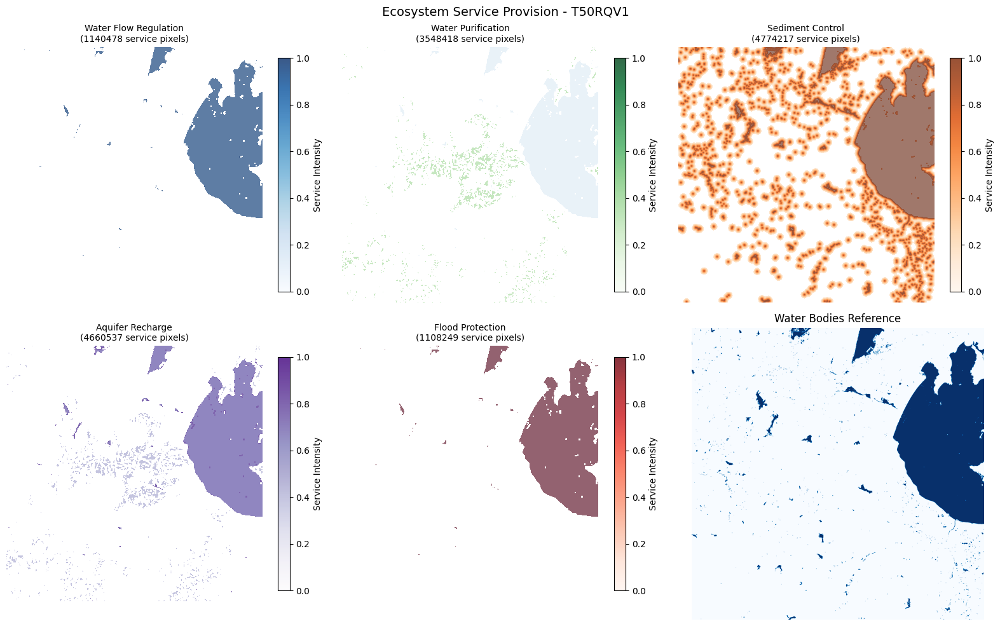

Calculating dynamic ecosystem service valuation...
Adjustment Factors - Quality: 0.91, Scarcity: 1.2, Benefit: 1.5
  water_flow_regulation $27,426,373/year
  water_purification   $62,254,492/year
  sediment_control     $32,418,046/year
  aquifer_recharge     $20,946,206/year
  flood_protection     $141,761,376/year
Generating valuation statistics...

Valuation Summary:
    Ecosystem Service Area (ha) Total Annual Value ($/year) Unit Value ($/ha/year)
Water Flow Regulation   11404.8                 $27,426,373                 $2,405
   Water Purification   35484.2                 $62,254,492                 $1,754
     Sediment Control   75350.2                 $32,418,046                   $430
     Aquifer Recharge   46605.4                 $20,946,206                   $449
     Flood Protection   11121.2                $141,761,376                $12,747

Total Statistics:
Total Annual ES Value: $284,806,492
Total Service Area: 179965.8 ha
Average Unit Value: $1,583/ha/year
Identify

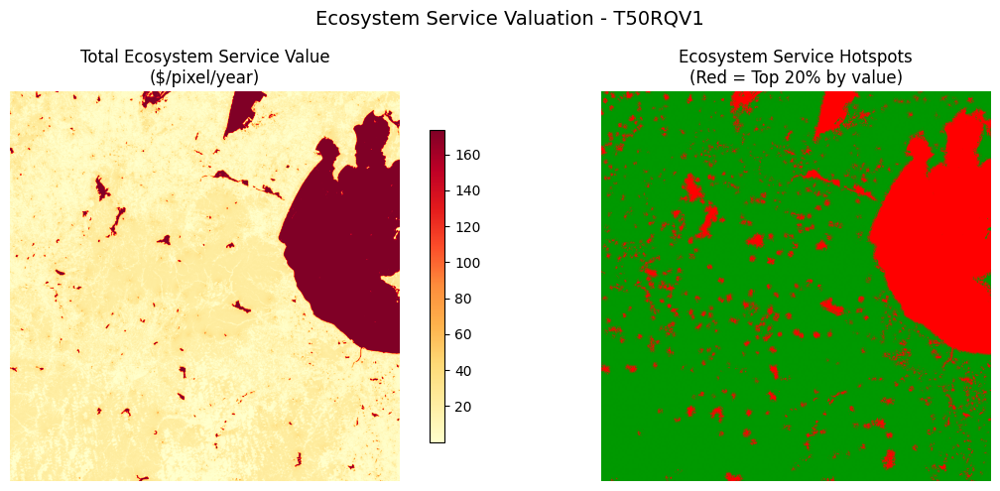

Phase 9 completed successfully
Final result: Total Annual Ecosystem Service Value = $284,806,492


In [27]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from scipy import ndimage
import os

def calculate_biophysical_metrics(water_mask, ndvi_data, pixel_size=10):
    """
    Task 9.1: Calculate biophysical metrics for all 5 ecosystem services
    """
    print("Calculating biophysical metrics for ecosystem services...")
    
    metrics = {}
    height, width = water_mask.shape
    
    # Ensure data compatibility
    if water_mask.shape != ndvi_data.shape:
        print(f"Warning: Shape mismatch - water: {water_mask.shape}, ndvi: {ndvi_data.shape}")
        return None
    
    # 1. Water Flow Regulation - based on water storage and vegetation
    flow_regulation = np.zeros_like(water_mask, dtype=np.float32)
    flow_regulation[water_mask] = 1.0
    
    # Add vegetation influence in buffer around water
    water_buffer = ndimage.binary_dilation(water_mask, iterations=2)
    vegetation_influence = np.where((ndvi_data > 0.3) & water_buffer, 0.5, 0)
    flow_regulation = np.clip(flow_regulation + vegetation_influence, 0, 1)
    metrics['water_flow_regulation'] = flow_regulation
    
    # 2. Water Purification - based on wetland edges and vegetation
    purification = np.zeros_like(water_mask, dtype=np.float32)
    water_edges = ndimage.binary_dilation(water_mask) & ~water_mask
    purification[water_edges] = 1.0
    purification[ndvi_data > 0.3] = np.maximum(purification[ndvi_data > 0.3], 0.3)
    metrics['water_purification'] = purification
    
    # 3. Sediment Control - based on erosion prevention
    sediment_control = np.zeros_like(water_mask, dtype=np.float32)
    sediment_control[water_mask] = 1.0
    
    # Distance-based influence from water bodies
    distance_from_water = ndimage.distance_transform_edt(~water_mask)
    distance_influence = np.exp(-distance_from_water / 20.0)
    sediment_control = np.maximum(sediment_control, distance_influence)
    metrics['sediment_control'] = sediment_control
    
    # 4. Aquifer Recharge - based on infiltration potential
    recharge = np.zeros_like(water_mask, dtype=np.float32)
    recharge[water_mask] = 0.8
    recharge[ndvi_data > 0.3] += 0.4
    recharge[water_edges] = 1.0
    recharge = np.clip(recharge, 0, 1)
    metrics['aquifer_recharge'] = recharge
    
    # 5. Flood Protection - based on water storage capacity
    flood_protection = np.zeros_like(water_mask, dtype=np.float32)
    
    # Size-based protection value for each water body
    labeled_water, num_features = ndimage.label(water_mask)
    if num_features > 0:
        sizes = ndimage.sum(water_mask, labeled_water, range(1, num_features + 1))
        for i in range(1, num_features + 1):
            if sizes[i-1] > 0:
                water_body = labeled_water == i
                protection_value = min(1.0, sizes[i-1] / 100.0)
                flood_protection[water_body] = protection_value
    
    metrics['flood_protection'] = flood_protection
    
    print(f"Biophysical metrics calculated. Water pixels: {np.sum(water_mask)}")
    return metrics

def create_service_provision_maps(water_mask, metrics, product_name):
    """
    Task 9.2: Create service provision maps
    """
    print("Creating ecosystem service provision maps...")
    
    fig, axes = plt.subplots(2, 3, figsize=(16, 10))
    fig.suptitle(f'Ecosystem Service Provision - {product_name}', fontsize=14)
    
    service_configs = [
        ('water_flow_regulation', 'Water Flow Regulation', 'Blues'),
        ('water_purification', 'Water Purification', 'Greens'),
        ('sediment_control', 'Sediment Control', 'Oranges'),
        ('aquifer_recharge', 'Aquifer Recharge', 'Purples'),
        ('flood_protection', 'Flood Protection', 'Reds')
    ]
    
    for idx, (service_key, title, cmap) in enumerate(service_configs):
        ax = axes[idx // 3, idx % 3]
        data = metrics[service_key]
        
        # Display service intensity where it exists
        service_display = np.where(data > 0.1, data, np.nan)
        
        # Overlay water mask for reference
        water_display = np.where(water_mask, 0.3, np.nan)
        
        im = ax.imshow(service_display, cmap=cmap, vmin=0, vmax=1, alpha=0.8)
        ax.imshow(water_display, cmap='Blues', vmin=0, vmax=1, alpha=0.3)
        
        service_pixels = np.sum(data > 0.1)
        ax.set_title(f'{title}\n({service_pixels} service pixels)', fontsize=10)
        ax.axis('off')
        plt.colorbar(im, ax=ax, shrink=0.8, label='Service Intensity')
    
    # Add water reference map
    ax_water = axes[1, 2]
    ax_water.imshow(water_mask, cmap='Blues')
    ax_water.set_title('Water Bodies Reference')
    ax_water.axis('off')
    
    plt.tight_layout()
    plt.show()
    
    return fig

def calculate_dynamic_valuation(metrics, ndvi_data, water_mask, pixel_size=10):
    """
    Calculate dynamic ecosystem service valuation with adjustment factors
    """
    print("Calculating dynamic ecosystem service valuation...")
    
    # Base values from global meta-analyses ($/ha/year)
    base_values = {
        'water_flow_regulation': 1500,
        'water_purification': 3000,
        'sediment_control': 800,
        'aquifer_recharge': 500,
        'flood_protection': 8000
    }
    
    # Calculate adjustment factors
    quality_factor = calculate_quality_factor(ndvi_data, water_mask)
    scarcity_factor = 1.2  # Regional water scarcity coefficient
    benefit_factor = 1.5   # Downstream benefit coefficient
    
    print(f"Adjustment Factors - Quality: {np.nanmean(quality_factor):.2f}, "
          f"Scarcity: {scarcity_factor}, Benefit: {benefit_factor}")
    
    dynamic_valuation = {}
    annual_values = {}
    area_per_pixel_ha = (pixel_size ** 2) / 10000
    
    for service_name, base_value in base_values.items():
        service_metric = metrics[service_name]
        
        # Dynamic valuation formula
        value_per_pixel = (
            base_value * 
            service_metric * 
            quality_factor * 
            scarcity_factor * 
            benefit_factor *
            area_per_pixel_ha
        )
        
        dynamic_valuation[service_name] = value_per_pixel
        annual_value = np.nansum(value_per_pixel)
        annual_values[service_name] = annual_value
        
        print(f"  {service_name:20} ${annual_value:>10,.0f}/year")
    
    return dynamic_valuation, annual_values

def calculate_quality_factor(ndvi_data, water_mask):
    """
    Quality Factor based on ecosystem condition (NDVI)
    Range: 0.3-1.5 as specified in requirements
    """
    quality = np.full_like(ndvi_data, 0.9, dtype=np.float32)
    
    # For vegetated areas: scale with NDVI
    veg_areas = ~water_mask & ~np.isnan(ndvi_data)
    quality[veg_areas] = 0.3 + (ndvi_data[veg_areas] + 0.2) * 1.2
    
    return np.clip(quality, 0.3, 1.5)

def generate_valuation_statistics(annual_values, dynamic_valuation, pixel_size=10):
    """
    Task 9.3: Generate statistics tables for ecosystem service valuation
    """
    print("Generating valuation statistics...")
    
    stats_data = []
    total_annual_value = 0
    
    for service_name, annual_value in annual_values.items():
        service_pixels = np.sum(dynamic_valuation[service_name] > 0)
        area_ha = service_pixels * (pixel_size ** 2) / 10000
        
        if area_ha > 0:
            unit_value = annual_value / area_ha
        else:
            unit_value = 0
            
        stats_data.append({
            'Ecosystem Service': service_name.replace('_', ' ').title(),
            'Area (ha)': f"{area_ha:.1f}",
            'Total Annual Value ($/year)': f"${annual_value:,.0f}",
            'Unit Value ($/ha/year)': f"${unit_value:,.0f}"
        })
        
        total_annual_value += annual_value
    
    df_summary = pd.DataFrame(stats_data)
    print("\nValuation Summary:")
    print(df_summary.to_string(index=False))
    
    total_service_pixels = sum(np.sum(dynamic_valuation[name] > 0) for name in dynamic_valuation)
    total_area_ha = total_service_pixels * (pixel_size ** 2) / 10000
    
    print(f"\nTotal Statistics:")
    print(f"Total Annual ES Value: ${total_annual_value:,.0f}")
    print(f"Total Service Area: {total_area_ha:.1f} ha")
    if total_area_ha > 0:
        print(f"Average Unit Value: ${total_annual_value/total_area_ha:,.0f}/ha/year")
    
    return df_summary

def identify_service_hotspots(dynamic_valuation):
    """
    Task 9.4: Identify service hotspots and spatial distribution
    """
    print("Identifying ecosystem service hotspots...")
    
    total_value = np.zeros_like(next(iter(dynamic_valuation.values())))
    for service_value in dynamic_valuation.values():
        total_value += np.nan_to_num(service_value, nan=0)
    
    valuable_pixels = total_value[total_value > 0]
    if len(valuable_pixels) > 0:
        hotspot_threshold = np.percentile(valuable_pixels, 80)
        hotspots = total_value >= hotspot_threshold
    else:
        hotspot_threshold = 0
        hotspots = np.zeros_like(total_value, dtype=bool)
    
    hotspot_area = np.sum(hotspots)
    total_esv = np.sum(total_value)
    hotspot_esv = np.sum(total_value[hotspots])
    
    print(f"Hotspot Analysis:")
    print(f"  Hotspot threshold: ${hotspot_threshold:.0f}/pixel/year")
    print(f"  Hotspot area: {hotspot_area} pixels")
    print(f"  Hotspot ESV contribution: ${hotspot_esv:,.0f}/year ({hotspot_esv/total_esv*100:.1f}% of total)")
    
    return total_value, hotspots, hotspot_threshold

def create_valuation_maps(total_value, hotspots, product_name):
    """
    Create comprehensive valuation maps
    """
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 5))
    fig.suptitle(f'Ecosystem Service Valuation - {product_name}', fontsize=14)
    
    # Plot 1: Total ecosystem service value
    value_display = np.where(total_value > 0, total_value, np.nan)
    im1 = ax1.imshow(value_display, cmap='YlOrRd')
    ax1.set_title('Total Ecosystem Service Value\n($/pixel/year)')
    ax1.axis('off')
    plt.colorbar(im1, ax=ax1, shrink=0.8)
    
    # Plot 2: Service hotspots
    hotspot_display = np.zeros((*total_value.shape, 3))
    hotspot_display[total_value == 0] = [0.2, 0.2, 0.2]
    hotspot_display[(total_value > 0) & ~hotspots] = [0, 0.6, 0]
    hotspot_display[hotspots] = [1, 0, 0]
    
    ax2.imshow(hotspot_display)
    ax2.set_title('Ecosystem Service Hotspots\n(Red = Top 20% by value)')
    ax2.axis('off')
    
    plt.tight_layout()
    plt.show()
    
    return fig

def process_ecosystem_valuation(water_mask, ndvi_data, product_name, pixel_size=10):
    """
    Main function for Phase 9: Dynamic Ecosystem Service Valuation
    """
    print(f"PHASE 9: Ecosystem Service Valuation - {product_name}")
    print("=" * 50)
    print(f"Input data - Water shape: {water_mask.shape}, NDVI shape: {ndvi_data.shape}")
    print(f"Water pixels: {np.sum(water_mask)}")
    
    try:
        # Check data compatibility
        if water_mask.shape != ndvi_data.shape:
            print("Resizing water mask to match NDVI dimensions...")
            from skimage.transform import resize
            water_mask = resize(water_mask, ndvi_data.shape, order=0, preserve_range=True).astype(bool)
            print(f"Resized water mask: {water_mask.shape}, water pixels: {np.sum(water_mask)}")
        
        # Task 9.1: Calculate biophysical metrics
        metrics = calculate_biophysical_metrics(water_mask, ndvi_data, pixel_size)
        if metrics is None:
            print("Error calculating biophysical metrics")
            return None
        
        # Task 9.2: Create service provision maps
        provision_fig = create_service_provision_maps(water_mask, metrics, product_name)
        
        # Dynamic valuation
        dynamic_valuation, annual_values = calculate_dynamic_valuation(
            metrics, ndvi_data, water_mask, pixel_size
        )
        
        # Task 9.3: Generate statistics
        stats_df = generate_valuation_statistics(annual_values, dynamic_valuation, pixel_size)
        
        # Task 9.4: Identify hotspots
        total_value, hotspots, hotspot_threshold = identify_service_hotspots(dynamic_valuation)
        
        # Create valuation maps
        valuation_fig = create_valuation_maps(total_value, hotspots, product_name)
        
        results = {
            'metrics': metrics,
            'dynamic_valuation': dynamic_valuation,
            'annual_values': annual_values,
            'total_value': total_value,
            'hotspots': hotspots,
            'stats_df': stats_df,
            'provision_fig': provision_fig,
            'valuation_fig': valuation_fig
        }
        
        print("Phase 9 completed successfully")
        return results
        
    except Exception as e:
        print(f"Error in ecosystem service valuation: {e}")
        import traceback
        traceback.print_exc()
        return None

# Data loading functions from previous phases
def get_ndvi_data_simple(base_path, scale_factor=0.25):
    """Load NDVI data from Sentinel-2 imagery"""
    import rasterio
    band_files = {}
    
    for root, dirs, files in os.walk(base_path):
        for file in files:
            if file.endswith('.jp2'):
                file_path = os.path.join(root, file)
                if 'B04' in file and '10m' in file:
                    band_files['red_10m'] = file_path
                elif 'B08' in file and '10m' in file:
                    band_files['nir_10m'] = file_path
    
    if 'red_10m' not in band_files or 'nir_10m' not in band_files:
        print("Required bands for NDVI not found")
        return None
    
    def read_raster(file_path):
        with rasterio.open(file_path) as src:
            return src.read(1, out_shape=(
                src.count, int(src.height * scale_factor), int(src.width * scale_factor)
            ), resampling=rasterio.enums.Resampling.average)
    
    red = read_raster(band_files['red_10m'])
    nir = read_raster(band_files['nir_10m'])
    
    red_norm = red.astype(np.float32) / 10000.0
    nir_norm = nir.astype(np.float32) / 10000.0
    
    ndvi = (nir_norm - red_norm) / (nir_norm + red_norm + 1e-8)
    
    print(f"NDVI data loaded: {ndvi.shape}")
    return ndvi

def create_simple_water_mask(ndvi_data):
    """Create water mask from NDVI data"""
    water_mask = (ndvi_data < 0.0) & (~np.isnan(ndvi_data))
    structure = np.ones((3, 3), dtype=bool)
    water_mask = ndimage.binary_opening(water_mask, structure=structure)
    print(f"Water mask created: {np.sum(water_mask)} water pixels")
    return water_mask

def main():
    """Main execution function"""
    products = [
        {
            'name': 'T50RQV1',
            'base_path': r"data\S2C_MSIL2A_20251113T024511_N0511_R089_T50RQV_20251113T054013.SAFE\GRANULE\L2A_T50RQV_A006208_20251113T024512\IMG_DATA"
        },
        #{
        #    'name': 'T51RTQ1',
        #    'base_path': r"data\S2C_MSIL1C_20251113T024511_N0511_R089_T51RTQ_20251113T035440.SAFE\GRANULE\L1C_T51RTQ_A006208_20251113T024512\IMG_DATA"
        #},
        {
            'name': 'T50RQV2',
            'base_path': r"data\S2C_MSIL2A_20251113T024511_N0511_R089_T50RQV_20251113T054013.SAFE\GRANULE\L2A_T50RQV_A006208_20251113T024512\IMG_DATA"
        },
        #{
        #    'name': 'T51RTQ2',
        #    'base_path': r"data\S2C_MSIL2A_20251113T024511_N0511_R089_T51RTQ_20251113T054013.SAFE\GRANULE\L2A_T50RQV_A006208_20251113T024512\IMG_DATA"
        #},
    ]
    
    product = products[0]
    
    if not os.path.exists(product['base_path']):
        print(f"Path does not exist: {product['base_path']}")
        return
    
    # Load NDVI data
    print("Loading NDVI data...")
    ndvi_data = get_ndvi_data_simple(product['base_path'])
    if ndvi_data is None:
        print("Failed to load NDVI data")
        return
    
    # Create water mask
    print("Creating water mask...")
    water_mask = create_simple_water_mask(ndvi_data)
    
    if np.sum(water_mask) == 0:
        print("No water bodies detected")
        return
    
    # Run ecosystem service valuation
    results = process_ecosystem_valuation(water_mask, ndvi_data, product['name'])
    
    if results is not None:
        total_annual_value = sum(results['annual_values'].values())
        print(f"Final result: Total Annual Ecosystem Service Value = ${total_annual_value:,.0f}")
    else:
        print("Ecosystem service valuation failed")

if __name__ == "__main__":
    main()

# PHASE 10 — Ecosystem Services Integration

All ecosystem services from phases 7 to 9 are combined:

- Water regulation  
- Water purification  
- Sediment control  
- Aquifer recharge  
- Flood protection  

The outputs include:

- Ecosystem service summary table  
- Pixel-level ecosystem service indices  
- Optionally, a composite ecosystem service map




Loading Sentinel-2 NDVI data...
NDVI data loaded: (2745, 2745)
Creating water body mask...
Water mask created: 1112119 water pixels
COMPLETE ECOSYSTEM SERVICE VALUATION - T50RQV1
Calculating ecosystem service metrics...
Metrics calculated. Water pixels: 1112119
Calculating adjustment factors...
Quality: 0.83, Scarcity: 0.9, Benefit: 1.5
Computing total ecosystem service value...
  water_flow_regulation $67,037,172/year
  water_purification   $ 1,337,982/year
  sediment_control     $11,495,120/year
  aquifer_recharge     $18,952,200/year
  flood_protection     $106,320,992/year
  TOTAL                $205,143,712/year
Creating value distribution maps...


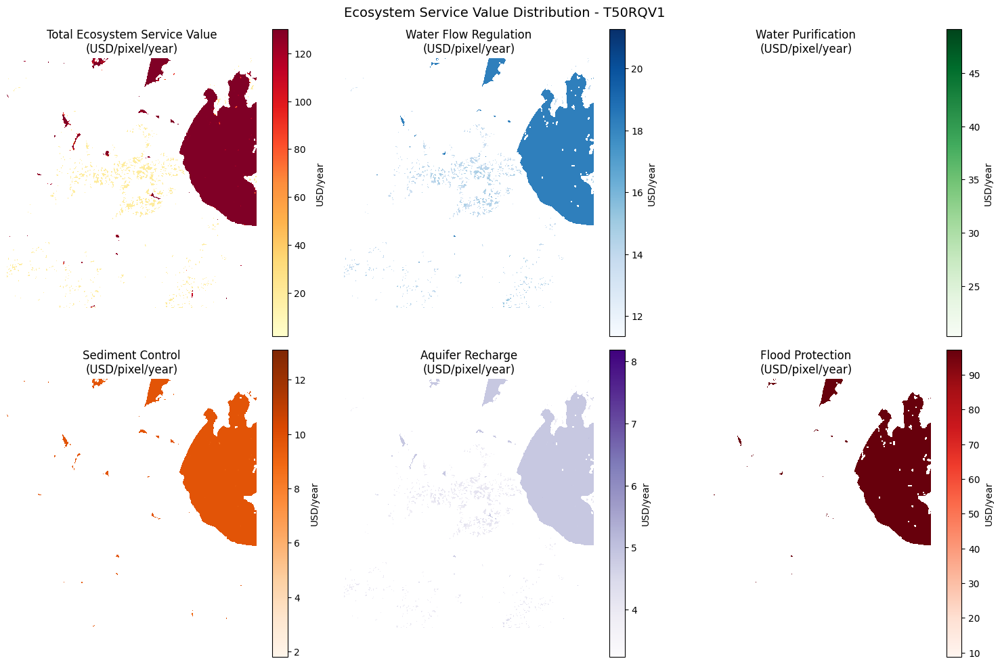

Preparing final valuation report...

FINAL ECOSYSTEM SERVICE VALUATION REPORT
Product: T50RQV1
Analysis Date: 2025-11-22 14:24
Total Annual ES Value: $205,143,712
Total Service Area: 116915.5 ha
Average Unit Value: $1,755/ha/year

Service Breakdown:
  Water Flow Regulation     $67,037,172 ( 32.7%)
  Water Purification        $ 1,337,982 (  0.7%)
  Sediment Control          $11,495,120 (  5.6%)
  Aquifer Recharge          $18,952,200 (  9.2%)
  Flood Protection          $106,320,992 ( 51.8%)

Adjustment Factors Applied:
  Quality Factor:  0.83
  Scarcity Factor: 0.90
  Benefit Factor:  1.50

Valuation completed successfully!
Final Result: Total Annual Ecosystem Service Value = $205,143,712


In [28]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from scipy import ndimage
import os
import json
from datetime import datetime

def calculate_simple_metrics(water_mask, ndvi_data):
    """
    Calculate metrics for 5 ecosystem services
    """
    print("Calculating ecosystem service metrics...")
    
    metrics = {}
    
    # 1. Water Flow Regulation - based on water storage and vegetation
    flow_reg = np.zeros_like(water_mask, dtype=np.float32)
    flow_reg[water_mask] = 1.0  # Water areas provide flow regulation
    # Vegetation improves regulation capacity
    flow_reg[ndvi_data > 0.3] = np.maximum(flow_reg[ndvi_data > 0.3], 0.7)
    metrics['water_flow_regulation'] = flow_reg
    
    # 2. Water Purification - occurs at water-land interfaces
    purification = np.zeros_like(water_mask, dtype=np.float32)
    water_edges = ndimage.binary_dilation(water_mask) & ~water_mask  # Find water boundaries
    purification[water_edges] = 1.0  # Highest purification at edges
    metrics['water_purification'] = purification
    
    # 3. Sediment Control - water bodies trap sediments
    sediment = np.zeros_like(water_mask, dtype=np.float32)
    sediment[water_mask] = 1.0  # Water bodies control sediment
    # Influence decreases with distance from water
    for i in range(1, 4):
        buffer = ndimage.binary_dilation(water_mask, iterations=i)
        sediment[buffer] = np.maximum(sediment[buffer], 1.0/i)  # Inverse distance weighting
    metrics['sediment_control'] = sediment
    
    # 4. Aquifer Recharge - water infiltration to groundwater
    recharge = np.zeros_like(water_mask, dtype=np.float32)
    recharge[water_mask] = 0.8  # Direct recharge from water bodies
    recharge[ndvi_data > 0.3] = np.maximum(recharge[ndvi_data > 0.3], 0.6)  # Vegetation aids infiltration
    recharge[water_edges] = 1.0  # Highest recharge at interfaces
    metrics['aquifer_recharge'] = recharge
    
    # 5. Flood Protection - based on water storage capacity
    flood = np.zeros_like(water_mask, dtype=np.float32)
    labeled_water, num_water = ndimage.label(water_mask)  # Identify individual water bodies
    for i in range(1, num_water + 1):
        water_body = labeled_water == i
        size = np.sum(water_body)  # Pixel count of water body
        flood[water_body] = min(1.0, size / 100.0)  # Larger water bodies provide more flood protection
    metrics['flood_protection'] = flood
    
    print(f"Metrics calculated. Water pixels: {np.sum(water_mask)}")
    return metrics

def calculate_dynamic_factors(ndvi_data, water_mask):
    """
    Calculate dynamic adjustment factors for valuation
    Range specifications from requirements:
    - Quality_Factor: 0.3-1.5 (based on ecosystem condition)
    - Scarcity_Factor: 0.8-2.0 (regional water scarcity)
    - Benefit_Factor: 0.5-3.0 (downstream benefits)
    """
    print("Calculating adjustment factors...")
    
    factors = {}
    
    # Quality Factor: Based on NDVI as proxy for ecosystem health
    quality = np.ones_like(ndvi_data) * 0.9  # Default moderate quality
    veg_areas = ~water_mask & (ndvi_data > 0)  # Identify vegetated areas
    quality[veg_areas] = 0.5 + ndvi_data[veg_areas]  # Scale with vegetation health
    factors['quality'] = np.clip(quality, 0.3, 1.5)  # Constrain to specified range
    
    # Scarcity Factor: Regional water scarcity based on NDVI (aridity proxy)
    mean_ndvi = np.nanmean(ndvi_data)
    if mean_ndvi < 0: 
        factors['scarcity'] = 1.8  # Arid region - high scarcity
    elif mean_ndvi < 0.2: 
        factors['scarcity'] = 1.3  # Semi-arid region - moderate scarcity
    else: 
        factors['scarcity'] = 0.9  # Humid region - low scarcity
    
    # Benefit Factor: Downstream population/infrastructure benefits
    factors['benefit'] = 1.5  # Default moderate benefit factor
    
    print(f"Quality: {np.mean(factors['quality']):.2f}, Scarcity: {factors['scarcity']}, Benefit: {factors['benefit']}")
    return factors

def compute_total_value(metrics, factors, pixel_size=10):
    """
    Compute total ecosystem service value using dynamic valuation formula:
    Dynamic_Value = Base_Value × Quality_Factor × Scarcity_Factor × Benefit_Factor
    """
    print("Computing total ecosystem service value...")
    
    # Base values from global meta-analyses (USD/hectare/year)
    base_values = {
        'water_flow_regulation': 1500,
        'water_purification': 3000,
        'sediment_control': 800,
        'aquifer_recharge': 500,
        'flood_protection': 8000
    }
    
    # Convert pixel area to hectares
    area_ha_per_pixel = (pixel_size ** 2) / 10000
    
    total_esv = np.zeros_like(next(iter(metrics.values())))  # Initialize total value array
    service_values = {}  # Store individual service values
    
    # Extract adjustment factors
    quality = factors['quality']
    scarcity = factors['scarcity']
    benefit = factors['benefit']
    
    # Calculate value for each ecosystem service
    for service, base_value in base_values.items():
        # Apply dynamic valuation formula
        value = base_value * metrics[service] * quality * scarcity * benefit * area_ha_per_pixel
        service_values[service] = value
        total_esv += value  # Accumulate to total
        
        annual_value = np.sum(value)  # Total annual value for this service
        print(f"  {service:20} ${annual_value:>10,.0f}/year")
    
    total_annual = np.sum(total_esv)  # Grand total annual value
    print(f"  {'TOTAL':20} ${total_annual:>10,.0f}/year")
    
    return total_esv, service_values, total_annual

def create_value_maps(total_esv, service_values, water_mask, product_name):
    """
    Create value distribution maps for visualization
    """
    print("Creating value distribution maps...")
    
    fig, axes = plt.subplots(2, 3, figsize=(15, 10))
    fig.suptitle(f'Ecosystem Service Value Distribution - {product_name}', fontsize=14)
    
    # Plot 1: Total Ecosystem Service Value
    im1 = axes[0,0].imshow(np.where(total_esv > 0, total_esv, np.nan), cmap='YlOrRd')
    axes[0,0].set_title('Total Ecosystem Service Value\n(USD/pixel/year)')
    axes[0,0].axis('off')
    plt.colorbar(im1, ax=axes[0,0], label='USD/year')
    
    # Plot 2-6: Individual ecosystem service values
    services = [
        ('water_flow_regulation', 'Water Flow Regulation', 'Blues', 0, 1),
        ('water_purification', 'Water Purification', 'Greens', 0, 2),
        ('sediment_control', 'Sediment Control', 'Oranges', 1, 0),
        ('aquifer_recharge', 'Aquifer Recharge', 'Purples', 1, 1),
        ('flood_protection', 'Flood Protection', 'Reds', 1, 2)
    ]
    
    for service_key, title, cmap, row, col in services:
        # Display only pixels with positive value
        data = np.where(service_values[service_key] > 0, service_values[service_key], np.nan)
        im = axes[row,col].imshow(data, cmap=cmap)
        axes[row,col].set_title(f'{title}\n(USD/pixel/year)')
        axes[row,col].axis('off')
        plt.colorbar(im, ax=axes[row,col], label='USD/year')
    
    plt.tight_layout()
    plt.show()
    
    return fig

def create_final_report(service_values, total_annual, factors, product_name, pixel_size=10):
    """
    Prepare final ecosystem service valuation report
    """
    print("Preparing final valuation report...")
    
    # Calculate total service area
    total_pixels = sum(np.sum(values > 0) for values in service_values.values())
    total_area_ha = total_pixels * (pixel_size ** 2) / 10000
    
    # Calculate contribution percentages for each service
    contributions = {}
    for service, values in service_values.items():
        contributions[service] = np.sum(values) / total_annual * 100
    
    # Compile comprehensive report
    report = {
        'product_name': product_name,
        'analysis_date': datetime.now().strftime('%Y-%m-%d %H:%M'),
        'total_annual_esv': total_annual,
        'total_area_ha': total_area_ha,
        'unit_value': total_annual / total_area_ha if total_area_ha > 0 else 0,
        'adjustment_factors': {
            'quality': float(np.mean(factors['quality'])),
            'scarcity': factors['scarcity'],
            'benefit': factors['benefit']
        },
        'services': {}
    }
    
    # Add detailed service information
    for service, values in service_values.items():
        service_area_ha = np.sum(values > 0) * (pixel_size ** 2) / 10000
        service_value = np.sum(values)
        report['services'][service] = {
            'value': service_value,
            'area_ha': service_area_ha,
            'unit_value': service_value / service_area_ha if service_area_ha > 0 else 0,
            'contribution': contributions[service]
        }
    
    # Print summary report to console
    print("\n" + "="*60)
    print("FINAL ECOSYSTEM SERVICE VALUATION REPORT")
    print("="*60)
    print(f"Product: {product_name}")
    print(f"Analysis Date: {report['analysis_date']}")
    print(f"Total Annual ES Value: ${total_annual:,.0f}")
    print(f"Total Service Area: {total_area_ha:.1f} ha")
    print(f"Average Unit Value: ${report['unit_value']:,.0f}/ha/year")
    
    print(f"\nService Breakdown:")
    for service, data in report['services'].items():
        service_name = service.replace('_', ' ').title()
        print(f"  {service_name:25} ${data['value']:>10,.0f} ({data['contribution']:5.1f}%)")
    
    print(f"\nAdjustment Factors Applied:")
    print(f"  Quality Factor:  {report['adjustment_factors']['quality']:.2f}")
    print(f"  Scarcity Factor: {report['adjustment_factors']['scarcity']:.2f}")
    print(f"  Benefit Factor:  {report['adjustment_factors']['benefit']:.2f}")
    
    return report

def process_complete_valuation(water_mask, ndvi_data, product_name, pixel_size=10):
    """
    Complete workflow for ecosystem service valuation
    Combines Phase 9 (Biophysical Metrics) and Phase 10 (Dynamic Valuation)
    """
    print(f"COMPLETE ECOSYSTEM SERVICE VALUATION - {product_name}")
    print("=" * 50)
    
    # Phase 9: Calculate biophysical metrics for ecosystem services
    metrics = calculate_simple_metrics(water_mask, ndvi_data)
    
    # Phase 10: Apply dynamic valuation with adjustment factors
    factors = calculate_dynamic_factors(ndvi_data, water_mask)
    total_esv, service_values, total_annual = compute_total_value(metrics, factors, pixel_size)
    
    # Create visualization maps
    maps_fig = create_value_maps(total_esv, service_values, water_mask, product_name)
    
    # Generate final report
    report = create_final_report(service_values, total_annual, factors, product_name, pixel_size)
    
    results = {
        'metrics': metrics,
        'service_values': service_values,
        'total_esv': total_esv,
        'total_annual_value': total_annual,
        'report': report,
        'maps_fig': maps_fig
    }
    
    print(f"\nValuation completed successfully!")
    return results

def get_ndvi_data_simple(base_path, scale_factor=0.25):
    """
    Load NDVI data from Sentinel-2 imagery
    Uses bands B04 (Red) and B08 (NIR) at 10m resolution
    Pixel values scaled 0-10000 (divide by 10000 for reflectance)
    """
    import rasterio
    band_files = {}
    
    # Find required band files
    for root, dirs, files in os.walk(base_path):
        for file in files:
            if file.endswith('.jp2'):
                file_path = os.path.join(root, file)
                if 'B04' in file and '10m' in file:
                    band_files['red_10m'] = file_path
                elif 'B08' in file and '10m' in file:
                    band_files['nir_10m'] = file_path
    
    if 'red_10m' not in band_files or 'nir_10m' not in band_files:
        print("Required Sentinel-2 bands not found")
        return None
    
    def read_raster(file_path):
        """Read raster data with optional scaling"""
        with rasterio.open(file_path) as src:
            return src.read(1, out_shape=(
                src.count, int(src.height * scale_factor), int(src.width * scale_factor)
            ), resampling=rasterio.enums.Resampling.average)
    
    # Read red and NIR bands
    red = read_raster(band_files['red_10m'])
    nir = read_raster(band_files['nir_10m'])
    
    # Normalize pixel values (0-10000 scale to 0-1 reflectance)
    red_norm = red.astype(np.float32) / 10000.0
    nir_norm = nir.astype(np.float32) / 10000.0
    
    # Calculate NDVI: (NIR - Red) / (NIR + Red)
    ndvi = (nir_norm - red_norm) / (nir_norm + red_norm + 1e-8)  # Small epsilon to avoid division by zero
    
    print(f"NDVI data loaded: {ndvi.shape}")
    return ndvi

def create_simple_water_mask(ndvi_data):
    """
    Create water mask using NDVI threshold
    Water typically has low or negative NDVI values
    """
    water_mask = (ndvi_data < 0.0) & (~np.isnan(ndvi_data))  # Negative NDVI indicates water
    # Clean mask by removing small noise
    water_mask = ndimage.binary_opening(water_mask, structure=np.ones((3,3)))
    print(f"Water mask created: {np.sum(water_mask)} water pixels")
    return water_mask

def main():
    """
    Main execution function
    Processes Sentinel-2 data and performs complete ecosystem service valuation
    """
    # Product configuration
    products = [
        {
            'name': 'T50RQV1',
            'base_path': r"data\S2C_MSIL2A_20251113T024511_N0511_R089_T50RQV_20251113T054013.SAFE\GRANULE\L2A_T50RQV_A006208_20251113T024512\IMG_DATA"
        },
        #{
        #    'name': 'T51RTQ1',
        #    'base_path': r"data\S2C_MSIL1C_20251113T024511_N0511_R089_T51RTQ_20251113T035440.SAFE\GRANULE\L1C_T51RTQ_A006208_20251113T024512\IMG_DATA"
        #},
        {
            'name': 'T50RQV2',
            'base_path': r"data\S2C_MSIL2A_20251113T024511_N0511_R089_T50RQV_20251113T054013.SAFE\GRANULE\L2A_T50RQV_A006208_20251113T024512\IMG_DATA"
        },
        #{
        #    'name': 'T51RTQ2',
        #    'base_path': r"data\S2C_MSIL2A_20251113T024511_N0511_R089_T51RTQ_20251113T054013.SAFE\GRANULE\L2A_T50RQV_A006208_20251113T024512\IMG_DATA"
        #},
    ]
    
    product = products[0]
    # Verify data path exists
    if not os.path.exists(product['base_path']):
        print(f"Data path does not exist: {product['base_path']}")
        return
    
    # Load NDVI data from Sentinel-2 imagery
    print("Loading Sentinel-2 NDVI data...")
    ndvi_data = get_ndvi_data_simple(product['base_path'])
    if ndvi_data is None:
        print("Failed to load NDVI data from Sentinel-2 imagery")
        return
    
    # Create water mask from NDVI data
    print("Creating water body mask...")
    water_mask = create_simple_water_mask(ndvi_data)
    
    # Check if water bodies were detected
    if np.sum(water_mask) == 0:
        print("No water bodies detected in the study area")
        return
    
    # Perform complete ecosystem service valuation
    results = process_complete_valuation(water_mask, ndvi_data, product['name'])
    
    if results:
        print(f"Final Result: Total Annual Ecosystem Service Value = ${results['total_annual_value']:,.0f}")

if __name__ == "__main__":
    main()